In [23]:
#!/usr/bin/env python3
"""
Jupyter Notebook: Navier-Stokes Model Analysis
Compares three models: D-PARC, PARC-v2, and Large PARC-v2.

This notebook:
1. Loads all three models (run once)
2. Runs parameter comparison
3. Runs visualization on a sample batch
4. Runs global RMSE calculation
"""

################################################################################
# CELL 1: Imports (Combined)
################################################################################
import os
import sys
import torch
import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import glob
import csv
from torch.utils.data import DataLoader
from skimage.metrics import structural_similarity as ssim

# Add project root to system path
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..", "..")))

# Import model and data components
from PARCtorch.PARCv2 import PARCv2
from PARCtorch.utilities.unet_deform import UNet
from PARCtorch.data.dataset import GenericPhysicsDataset, custom_collate_fn
from PARCtorch.differentiator.differentiator import ADRDifferentiator as Differentiator
from PARCtorch.differentiator.finitedifference import FiniteDifference
from PARCtorch.integrator.integrator import Integrator
from PARCtorch.integrator.heun import Heun

print("✓ All libraries imported successfully")

✓ All libraries imported successfully


In [24]:
################################################################################
# CELL 2: Configuration and Constants (Combined)
################################################################################
"""
Configure all paths, parameters, and settings for all tasks.
"""

# --- Model Checkpoints ---
MODEL_DEFORM_CHECKPOINT = '/home/jtb3sud/weights_dparc/ns/DPARC.pth' # 4000
MODEL_NO_DEFORM_CHECKPOINT = '/home/jtb3sud/weights_dparc/ns/PARCv2.pth' #2903 PARCtorch/PARCtorch/small_weights/phong_model_epoch_1000.pth /scratch/jtb3sud/Jesus/ns/weights/small_no_deform/best_model.pth
MODEL_LARGE_CHECKPOINT = '/home/jtb3sud/weights_dparc/ns/PARCv2L.pth' # 1506

# --- Data Paths ---
EVAL_DATA_DIR = '/project/vil_baek/data/physics/PARCTorch/NavierStokes/jack_train'
MIN_MAX_PATH = '../data/ns_min_max.json'
OUTPUT_DIR = '../results/comparison_ns'

# --- General Settings ---
FUTURE_STEPS = 38
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# --- Visualization-Specific Settings ---
BATCH_SIZE = 12
SAMPLE_ID_TO_COMPARE = 8
TIMESTEPS_TO_COMPARE = [0, 7, 14, 21, 28]
TIME_PER_STEP = 0.052631578
# Note: Viz script maps Pressure to channel 1, U to 2, V to 3
VIZ_CHANNEL_MAP = {
    'Pressure P': 1,
    'Velocity U': 2,
    'Velocity V': 3,
}
CMAP_CONFIG = {
    'Pressure P': {'cmap': 'viridis', 'label': 'GPa'},
    'Velocity U': {'cmap': 'seismic', 'label': 'm/s'},
    'Velocity V': {'cmap': 'seismic', 'label': 'm/s'},
}

# --- Metrics-Specific Settings (RMSE & SSIM) ---
# Note: Metrics scripts map Pressure to channel 0, and combine U(2)/V(3)
METRICS_CHANNEL_MAP = {
    'Pressure': 1,
    'Velocity Magnitude': (2, 3),
}
METRICS_UNITS = {
    'Pressure': 'Pa',
    'Velocity Magnitude': 'm/s',
}


print(f"✓ Configuration loaded. Using device: {DEVICE}")
print(f"✓ Output will be saved to: {OUTPUT_DIR}")

✓ Configuration loaded. Using device: cuda
✓ Output will be saved to: ../results/comparison_ns


In [25]:
################################################################################
# CELL 3: Model Building and Loading Utilities
################################################################################
"""
Helper functions to build and load models.
"""

def build_model(model_type, device):
    """
    Build the PARCTorch NS model.
    
    Args:
        model_type: 'deform', 'standard', or 'large'
        device: Device to load model on
    
    Returns:
        model: PARCv2 model instance
    """
    n_fe_features = 128
    
    if model_type == 'deform':
        unet_ns = UNet(
            block_dimensions=[64, 128, 256, 512, 1024],
            input_channels=4,
            output_channels=n_fe_features,
            up_block_use_concat=[False, True, False, True],
            skip_connection_indices=[2, 0],
            use_deform=True
        )
    elif model_type == 'standard':
        unet_ns = UNet(
            block_dimensions=[64, 128, 256, 512, 1024],
            input_channels=4,
            output_channels=n_fe_features,
            up_block_use_concat=[False, True, False, True],
            skip_connection_indices=[2, 0],
            use_deform=False
        )
    elif model_type == 'large':
        unet_ns = UNet(
            block_dimensions=[64, 128, 256, 512, 1024, 2048, 4096],
            input_channels=4,
            output_channels=n_fe_features,
            up_block_use_concat=[False, True, False, True, False, False],
            skip_connection_indices=[4, 2],
            use_deform=False
        )
    else:
        raise ValueError(f"Unknown model_type: {model_type}")

    right_diff = FiniteDifference(padding_mode="replicate")
    heun_int = Heun()

    diff_ns = Differentiator(
        2,
        n_fe_features,
        [2, 3],
        [2, 3],
        unet_ns,
        "constant",
        right_diff,
        True
    )

    ns_int = Integrator(
        True,
        [(0, 2, 3, 1)],
        heun_int,
        [None, None, None, None],
        "constant",
        right_diff,
    )

    criterion = torch.nn.L1Loss()

    model = PARCv2(
        differentiator=diff_ns,
        integrator=ns_int,
        loss=criterion
    )
    
    model = model.to(device)
    return model


def load_model(model, weights_path, device):
    if weights_path is None:
        logging.info("No weights path provided. Training will start from scratch.")
        return model
    #logging.info(f"Loading model weights from {weights_path}...")
    try:
        checkpoint = torch.load(weights_path, map_location=device)
        
        # Handle wrapped checkpoint format (with metadata)
        if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
            state_dict = checkpoint['model_state_dict']
        else:
            # Raw state dict
            state_dict = checkpoint
        
        model.load_state_dict(state_dict)
    except Exception as e:
        print("error")
        raise
    model.eval()
    return model

print("✓ Model utility functions defined.")

✓ Model utility functions defined.


In [26]:
################################################################################
# CELL 4: Build and Load All Models (Run Once)
################################################################################

# Clear CUDA cache before building models
if DEVICE == 'cuda':
    torch.cuda.empty_cache()
    print("✓ CUDA cache cleared")

# Build and load all three models
print("Building models...")
try:
    model_deform = build_model('deform', DEVICE)
    model_standard = build_model('standard', DEVICE)
    model_large = build_model('large', DEVICE)
except RuntimeError as e:
    if "CUDA" in str(e):
        print("⚠️ CUDA error detected. Clearing cache and retrying...")
        torch.cuda.empty_cache()
        torch.cuda.synchronize()
        model_deform = build_model('deform', DEVICE)
        model_standard = build_model('standard', DEVICE)
        model_large = build_model('large', DEVICE)
    else:
        raise

print("Loading model checkpoints...")
model_deform = load_model(model_deform, MODEL_DEFORM_CHECKPOINT, DEVICE)
model_standard = load_model(model_standard, MODEL_NO_DEFORM_CHECKPOINT, DEVICE)
model_large = load_model(model_large, MODEL_LARGE_CHECKPOINT, DEVICE)

print("✓ All three models built and loaded successfully")

✓ CUDA cache cleared
Building models...
Loading model checkpoints...
✓ All three models built and loaded successfully


In [27]:
################################################################################
# CELL 5: Load Normalization Parameters & Utilities (Run Once)
################################################################################

with open(MIN_MAX_PATH, 'r') as f:
    norm_params = json.load(f)

print(f"✓ Normalization parameters loaded from: {MIN_MAX_PATH}")

def denormalize(channel_idx, tensor, norm_params):
    """Denormalize a tensor for a specific channel."""
    channel_min = norm_params["channel_min"][channel_idx]
    channel_max = norm_params["channel_max"][channel_idx]
    return tensor * (channel_max - channel_min) + channel_min

print(f"✓ Denormalization utility function defined.")

✓ Normalization parameters loaded from: ../data/ns_min_max.json
✓ Denormalization utility function defined.


In [28]:
################################################################################
# CELL 6: Task 1 - Model Parameter Comparison
################################################################################
def count_parameters(model):
    """Count trainable parameters in a model."""
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def get_model_size_mb(model):
    """Calculate model size in MB."""
    param_size = 0
    buffer_size = 0
    
    # Count parameters (trainable and non-trainable)
    for param in model.parameters():
        param_size += param.nelement() * param.element_size()
    
    # Count buffers (e.g., running stats in batch norm)
    for buffer in model.buffers():
        buffer_size += buffer.nelement() * buffer.element_size()
    
    size_all_mb = (param_size + buffer_size) / 1024**2
    return size_all_mb

# Count parameters and get model sizes
params_deform = count_parameters(model_deform)
params_standard = count_parameters(model_standard)
params_large = count_parameters(model_large)

size_deform = get_model_size_mb(model_deform)
size_standard = get_model_size_mb(model_standard)
size_large = get_model_size_mb(model_large)

print("\n" + "="*80)
print("MODEL PARAMETER COMPARISON")
print("="*80)
print(f"D-PARC (deformable conv):     {params_deform:,} params | {size_deform:.2f} MB")
print(f"PARC-v2 (standard):         {params_standard:,} params | {size_standard:.2f} MB")
print(f"Large PARC-v2:              {params_large:,} params | {size_large:.2f} MB")
print(f"\nParameter Differences:")
print(f"  Deform vs Standard:         {params_deform - params_standard:+,} ({100*(params_deform - params_standard)/params_standard:+.2f}%)")
print(f"  Large vs Standard:          {params_large - params_standard:+,} ({100*(params_large - params_standard)/params_standard:+.2f}%)")
print(f"  Large vs Deform:            {params_large - params_deform:+,} ({100*(params_large - params_deform)/params_deform:+.2f}%)")
print(f"\nModel Size Differences:")
print(f"  Deform vs Standard:         {size_deform - size_standard:+.2f} MB ({100*(size_deform - size_standard)/size_standard:+.2f}%)")
print(f"  Large vs Standard:          {size_large - size_standard:+.2f} MB ({100*(size_large - size_standard)/size_standard:+.2f}%)")
print(f"  Large vs Deform:            {size_large - size_deform:+.2f} MB ({100*(size_large - size_deform)/size_deform:+.2f}%)")
print("="*80 + "\n")


MODEL PARAMETER COMPARISON
D-PARC (deformable conv):     16,863,661 params | 64.33 MB
PARC-v2 (standard):         16,347,459 params | 62.36 MB
Large PARC-v2:              240,687,427 params | 918.15 MB

Parameter Differences:
  Deform vs Standard:         +516,202 (+3.16%)
  Large vs Standard:          +224,339,968 (+1372.32%)
  Large vs Deform:            +223,823,766 (+1327.25%)

Model Size Differences:
  Deform vs Standard:         +1.97 MB (+3.16%)
  Large vs Standard:          +855.79 MB (+1372.32%)
  Large vs Deform:            +853.82 MB (+1327.25%)



In [29]:
################################################################################
# CELL 9E: Task 3E - Wall Clock Time Benchmark (Inference, Resolution-Normalized)
################################################################################

import time
import platform

# Set this once per notebook: "burgers", "navier_stokes", or "em"
DATASET_TAG = "ns"  # <-- change this per notebook

print("\n" + "="*80)
print(f"[{DATASET_TAG}] BENCHMARKING WALL CLOCK INFERENCE TIME")
print("="*80)

# ============================================================================
# HARDWARE INFO (for reproducibility / reporting alongside timing results)
# ============================================================================
print("\n" + "="*80)
print("HARDWARE CONFIGURATION")
print("="*80)

if torch.cuda.is_available():
    gpu_idx = torch.cuda.current_device()
    gpu_name = torch.cuda.get_device_name(gpu_idx)
    gpu_props = torch.cuda.get_device_properties(gpu_idx)
    total_mem_gb = gpu_props.total_memory / (1024**3)
    cuda_version = torch.version.cuda
    cudnn_version = torch.backends.cudnn.version()

    print(f"GPU: {gpu_name}")
    print(f"Total GPU Memory: {total_mem_gb:.2f} GB")
    print(f"Compute Capability: {gpu_props.major}.{gpu_props.minor}")
    print(f"CUDA Version: {cuda_version}")
    print(f"cuDNN Version: {cudnn_version}")
    print(f"PyTorch Version: {torch.__version__}")

    hardware_info = {
        'device': gpu_name,
        'total_memory_gb': f'{total_mem_gb:.2f}',
        'compute_capability': f'{gpu_props.major}.{gpu_props.minor}',
        'cuda_version': str(cuda_version),
        'cudnn_version': str(cudnn_version),
        'pytorch_version': torch.__version__,
    }
else:
    cpu_name = platform.processor() or "Unknown CPU"
    print(f"No GPU detected — running on CPU: {cpu_name}")
    print(f"PyTorch Version: {torch.__version__}")

    hardware_info = {
        'device': f'CPU ({cpu_name})',
        'total_memory_gb': 'N/A',
        'compute_capability': 'N/A',
        'cuda_version': 'N/A',
        'cudnn_version': 'N/A',
        'pytorch_version': torch.__version__,
    }
print("="*80)

# ============================================================================
# CONFIG
# ============================================================================
N_WARMUP = 10          # untimed warmup runs — lets cuDNN pick kernels, avoids first-call overhead
N_TRIALS = 50          # timed runs to average over
BENCHMARK_BATCH_SIZE = 1  # set >1 if you want throughput at larger batch sizes too

models_to_benchmark = {
    'D-PARC': model_deform,
    'PARCv2': model_standard,
    'PARCv2-L': model_large,
}

# Use one representative test file to build a realistic input (same shape as your real inference)
sample_file = test_files[0]
full_sim = np.load(sample_file)
full_sim_tensor = torch.from_numpy(full_sim).float().to(DEVICE)

normalized_sim = torch.zeros_like(full_sim_tensor)
for ch in range(full_sim_tensor.shape[1]):
    channel_min = norm_params["channel_min"][ch]
    channel_max = norm_params["channel_max"][ch]
    normalized_sim[:, ch, :, :] = (full_sim_tensor[:, ch, :, :] - channel_min) / (channel_max - channel_min)

ic_single = normalized_sim[0:1, :, :, :]
ic = ic_single.repeat(BENCHMARK_BATCH_SIZE, 1, 1, 1)  # replicate for batch-size testing

# Capture spatial resolution for cross-dataset normalization
grid_h, grid_w = ic_single.shape[-2], ic_single.shape[-1]
n_pixels = grid_h * grid_w
n_megapixels = n_pixels / 1e6
print(f"\nGrid resolution: {grid_h} x {grid_w}  ({n_megapixels:.4f} megapixels)")

num_steps_to_predict = min(FUTURE_STEPS, full_sim_tensor.shape[0] - 1)
t0 = torch.tensor(0.0, device=DEVICE)
t1 = torch.arange(1, num_steps_to_predict + 1, dtype=torch.float32, device=DEVICE) / num_steps_to_predict

# ============================================================================
# BENCHMARK FUNCTION
# ============================================================================
def benchmark_model(model, ic, t0, t1, n_warmup, n_trials, device):
    model.eval()
    use_cuda = (device.type == 'cuda') if isinstance(device, torch.device) else ('cuda' in str(device))

    # --- Warmup (untimed) ---
    with torch.no_grad():
        for _ in range(n_warmup):
            _ = model(ic, t0, t1)
    if use_cuda:
        torch.cuda.synchronize()

    times_ms = []

    if use_cuda:
        starter = torch.cuda.Event(enable_timing=True)
        ender = torch.cuda.Event(enable_timing=True)
        with torch.no_grad():
            for _ in range(n_trials):
                starter.record()
                _ = model(ic, t0, t1)
                ender.record()
                torch.cuda.synchronize()
                times_ms.append(starter.elapsed_time(ender))  # milliseconds
    else:
        # CPU fallback: perf_counter is safe here since CPU ops are synchronous
        with torch.no_grad():
            for _ in range(n_trials):
                start = time.perf_counter()
                _ = model(ic, t0, t1)
                end = time.perf_counter()
                times_ms.append((end - start) * 1000.0)

    times_ms = np.array(times_ms)
    return times_ms

# ============================================================================
# RUN BENCHMARKS
# ============================================================================
timing_results = {}

for model_name, model in models_to_benchmark.items():
    print(f"\nBenchmarking {model_name}...")
    times_ms = benchmark_model(model, ic, t0, t1, N_WARMUP, N_TRIALS, DEVICE)
    timing_results[model_name] = times_ms

    mean_ms = times_ms.mean()
    std_ms = times_ms.std()
    median_ms = np.median(times_ms)
    per_step_ms = mean_ms / num_steps_to_predict

    print(f"  Full rollout ({num_steps_to_predict} steps): "
          f"{mean_ms:.3f} ± {std_ms:.3f} ms  (median: {median_ms:.3f} ms)")
    print(f"  Per-timestep: {per_step_ms:.4f} ms/step")

# ============================================================================
# PRINT COMPARISON TABLE + RELATIVE SPEEDUP (RESOLUTION-NORMALIZED)
# ============================================================================
print("\n" + "="*80)
print(f"[{DATASET_TAG}] WALL CLOCK TIME COMPARISON (Full Rollout)")
print("="*80)
print(f"{'Model':<15} {'Mean (ms)':<15} {'Per-Step (ms)':<18} {'Per-Step/MPx (ms)':<20} {'Relative to PARCv2':<20}")
print("-" * 100)

baseline_mean = timing_results['PARCv2'].mean()

timing_csv_rows = []
for model_name, times_ms in timing_results.items():
    mean_ms = times_ms.mean()
    std_ms = times_ms.std()
    per_step_ms = mean_ms / num_steps_to_predict
    per_step_per_mpx_ms = per_step_ms / n_megapixels  # resolution-normalized
    relative = mean_ms / baseline_mean

    relative_str = f"{relative:.2f}x" if model_name != 'PARCv2' else "1.00x (baseline)"
    print(f"{model_name:<15} {mean_ms:<15.3f} {per_step_ms:<18.4f} {per_step_per_mpx_ms:<20.4f} {relative_str:<20}")

    timing_csv_rows.append([
        model_name, f'{mean_ms:.4f}', f'{std_ms:.4f}', f'{np.median(times_ms):.4f}',
        f'{per_step_ms:.5f}', f'{per_step_per_mpx_ms:.5f}', f'{relative:.4f}',
        f'{grid_h}x{grid_w}',
    ])

# ============================================================================
# SAVE TO CSV (with hardware metadata header)
# ============================================================================
timing_csv_path = os.path.join(OUTPUT_DIR, f'wall_clock_timing_{DATASET_TAG}.csv')
with open(timing_csv_path, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['# Hardware Configuration'])
    for key, val in hardware_info.items():
        writer.writerow([f'# {key}', val])
    writer.writerow([])  # blank line separating metadata from data
    writer.writerow(['Model', 'Mean_ms', 'Std_ms', 'Median_ms', 'Per_Step_ms',
                      'Per_Step_Per_Megapixel_ms', 'Relative_to_PARCv2', 'Grid_Resolution'])
    writer.writerows(timing_csv_rows)

print(f"\n✓ [{DATASET_TAG}] Wall clock timing results saved to: {timing_csv_path}")
print("="*80)


[ns] BENCHMARKING WALL CLOCK INFERENCE TIME

HARDWARE CONFIGURATION
GPU: NVIDIA RTX A6000
Total GPU Memory: 47.40 GB
Compute Capability: 8.6
CUDA Version: 12.8
cuDNN Version: 91002
PyTorch Version: 2.9.1+cu128

Grid resolution: 128 x 256  (0.0328 megapixels)

Benchmarking D-PARC...
  Full rollout (38 steps): 2956.574 ± 428.830 ms  (median: 2772.520 ms)
  Per-timestep: 77.8046 ms/step

Benchmarking PARCv2...
  Full rollout (38 steps): 2252.034 ± 131.402 ms  (median: 2234.414 ms)
  Per-timestep: 59.2640 ms/step

Benchmarking PARCv2-L...
  Full rollout (38 steps): 3042.637 ± 113.715 ms  (median: 3024.574 ms)
  Per-timestep: 80.0694 ms/step

[ns] WALL CLOCK TIME COMPARISON (Full Rollout)
Model           Mean (ms)       Per-Step (ms)      Per-Step/MPx (ms)    Relative to PARCv2  
----------------------------------------------------------------------------------------------------
D-PARC          2956.574        77.8046            2374.4076            1.31x               
PARCv2          225

Loading evaluation dataset for visualization...


Listing samples: 100%|██████████| 13/13 [00:00<00:00, 68.72it/s]


✓ Dataset loaded. Total samples: 13
Running predictions on one batch...
✓ Predictions complete

CHECKING DATA ALIGNMENT
IC shape: torch.Size([12, 4, 128, 256]), Ground truth shape: torch.Size([38, 12, 4, 128, 256])
Does IC match GT[0]? False
✓ Ground truth EXCLUDES t=0. Alignment: pred[t] ↔ gt[t]

✓ Data organized for plotting Sample 8
Generating plot with individual color scales...
Using individual color scales for each subplot...
✓ Figure saved as: ../results/comparison_ns/ns_comparison_three_models_sample8_individual_scale.pdf
✓ Figure saved as: ../results/comparison_ns/ns_comparison_three_models_sample8_individual_scale.png


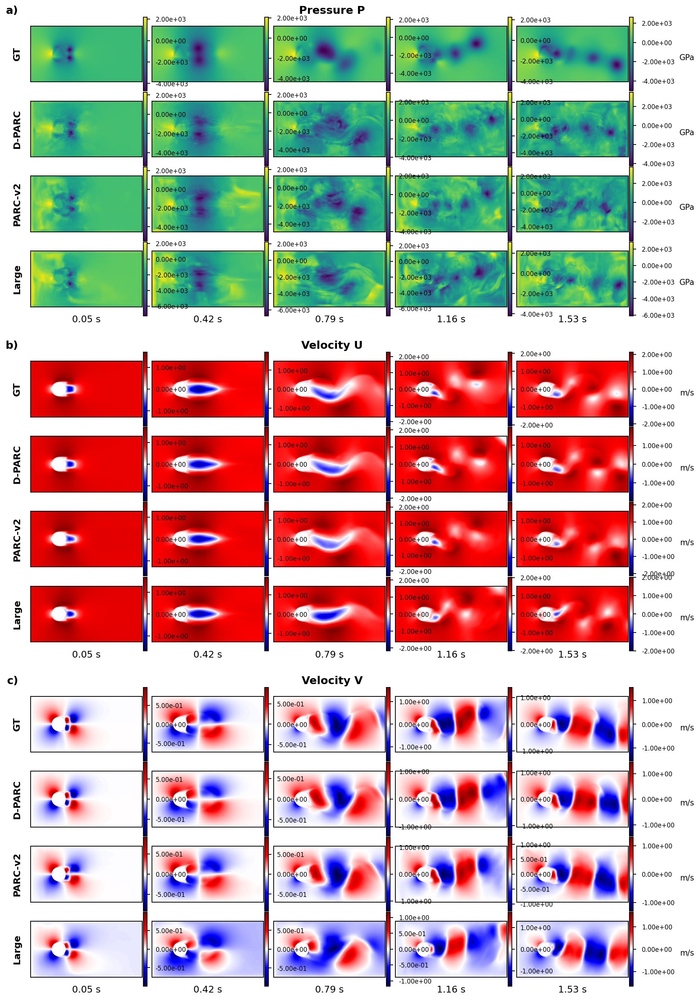


✓ Visualization complete!


In [16]:
################################################################################
# CELL 7: Task 2 - Generate Visualizations (Modified for Individual Scaling)
################################################################################

# --- 7a. Load Data for Visualization ---
print("Loading evaluation dataset for visualization...")
eval_dataset = GenericPhysicsDataset(
    data_dirs=[EVAL_DATA_DIR],
    future_steps=FUTURE_STEPS,
    min_max_path=MIN_MAX_PATH
)
eval_loader = DataLoader(
    eval_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=1,
    pin_memory=True if DEVICE == 'cuda' else False,
    collate_fn=custom_collate_fn
)
print(f"✓ Dataset loaded. Total samples: {len(eval_dataset)}")

# --- 7b. Run Predictions for Visualization ---
print("Running predictions on one batch...")
batch = next(iter(eval_loader))
ic, t0, t1, ground_truth = batch

ic = ic.to(DEVICE)
t0 = t0.to(DEVICE)
t1 = t1.to(DEVICE)
ground_truth = ground_truth.to(DEVICE)

with torch.no_grad():
    pred_deform = model_deform(ic, t0, t1)
    pred_standard = model_standard(ic, t0, t1)
    pred_large = model_large(ic, t0, t1)

print(f"✓ Predictions complete")

# --- 7c. Check Alignment ---
print("\n" + "="*80)
print("CHECKING DATA ALIGNMENT")
print(f"IC shape: {ic.shape}, Ground truth shape: {ground_truth.shape}")
ic_matches_gt0 = torch.allclose(ic[0], ground_truth[0, 0], atol=1e-6)
print(f"Does IC match GT[0]? {ic_matches_gt0}")
if ic_matches_gt0:
    print("✓ Ground truth INCLUDES t=0. Alignment: pred[t] ↔ gt[t+1]")
else:
    print("✓ Ground truth EXCLUDES t=0. Alignment: pred[t] ↔ gt[t]")
print("="*80 + "\n")

# --- 7d. Organize Data for Plotting ---
data_to_plot = {}
sample_idx = SAMPLE_ID_TO_COMPARE

if sample_idx >= BATCH_SIZE:
    print(f"⚠️ SAMPLE_ID_TO_COMPARE ({sample_idx}) is out of batch size ({BATCH_SIZE}). Defaulting to sample 0.")
    sample_idx = 0

for feature_name, channel_idx in VIZ_CHANNEL_MAP.items(): # Using VIZ_CHANNEL_MAP
    data_to_plot[feature_name] = {}
    
    for ts in TIMESTEPS_TO_COMPARE:
        if ts >= ground_truth.shape[0]:
            print(f"⚠️ Timestep {ts} out of range, skipping...")
            continue
            
        # Assuming ground_truth EXCLUDES t=0 (based on debug cell)
        gt_data = ground_truth[ts, sample_idx, channel_idx, :, :].cpu()
        pred_deform_data = pred_deform[ts, sample_idx, channel_idx, :, :].cpu()
        pred_standard_data = pred_standard[ts, sample_idx, channel_idx, :, :].cpu()
        pred_large_data = pred_large[ts, sample_idx, channel_idx, :, :].cpu()
        
        # Denormalize
        gt_denorm = denormalize(channel_idx, gt_data, norm_params).numpy()
        pred_deform_denorm = denormalize(channel_idx, pred_deform_data, norm_params).numpy()
        pred_standard_denorm = denormalize(channel_idx, pred_standard_data, norm_params).numpy()
        pred_large_denorm = denormalize(channel_idx, pred_large_data, norm_params).numpy()
        
        data_to_plot[feature_name][ts] = {
            'ground_truth': gt_denorm,
            'deform': pred_deform_denorm,
            'standard': pred_standard_denorm,
            'large': pred_large_denorm,
        }

print(f"✓ Data organized for plotting Sample {sample_idx}")

# --- 7e. Plotting Functions ---
def set_publication_style():
    """Set publication-quality matplotlib style parameters."""
    plt.rcParams.update({
        'font.family': 'DejaVu Sans', 'font.size': 6,
        'axes.labelsize': 6, 'axes.titlesize': 6,
        'xtick.labelsize': 5, 'ytick.labelsize': 5,
        'legend.fontsize': 5, 'figure.dpi': 300,
        'savefig.dpi': 300, 'savefig.bbox': 'tight',
        'savefig.pad_inches': 0.05, 'axes.linewidth': 0.5,
        'grid.linewidth': 0.5, 'lines.linewidth': 1.0,
        'patch.linewidth': 0.5, 'xtick.major.width': 0.5,
        'ytick.major.width': 0.5,
    })

# --- 7f. Generate Plot ---
print("Generating plot with individual color scales...")
if not data_to_plot:
    print("⚠️ The `data_to_plot` dictionary is empty.")
else:
    set_publication_style()
    
    features = list(VIZ_CHANNEL_MAP.keys())
    timesteps = TIMESTEPS_TO_COMPARE
    num_features = len(features)
    num_timesteps = len(timesteps)
    
    # ========== CREATE FIGURE ==========
    print("Using individual color scales for each subplot...")
    
    fig_width_mm = 180
    fig_width_in = fig_width_mm / 25.4
    panel_aspect_ratio = 2.0
    panel_width_in = fig_width_in / (num_timesteps + 0.5)
    panel_height_in = panel_width_in / panel_aspect_ratio
    fig_height_in = (4 * panel_height_in + 0.4) * num_features
    
    fig = plt.figure(figsize=(fig_width_in, fig_height_in))
    
    gs_outer = gridspec.GridSpec(
        num_features, 1, figure=fig, hspace=0.08,
        top=0.99, bottom=0.01, left=0.12, right=0.88
    )
    
    all_axes = []
    subfig_labels = ['a', 'b', 'c', 'd', 'e', 'f']
    
    for i, feature in enumerate(features):
        gs_inner = gridspec.GridSpecFromSubplotSpec(
            5, num_timesteps, subplot_spec=gs_outer[i], 
            hspace=0.02, wspace=0.04, height_ratios=[0.14, 1, 1, 1, 1]
        )
        
        # Feature title
        title_ax = fig.add_subplot(gs_inner[0, :])
        title_ax.text(-0.02, 0.5, f"{subfig_labels[i]})", fontsize=7, weight='bold', 
                        va='center', ha='right', transform=title_ax.transAxes)
        title_ax.text(0.5, 0.5, feature, fontsize=7, weight='bold', 
                        va='center', ha='center', transform=title_ax.transAxes)
        title_ax.axis('off')
        
        plot_axes = np.array([
            fig.add_subplot(gs_inner[r+1, c]) 
            for r in range(4) 
            for c in range(num_timesteps)
        ]).reshape(4, num_timesteps)
        all_axes.extend(plot_axes.flatten())
        
        cmap = CMAP_CONFIG[feature]['cmap']
        cbar_label = CMAP_CONFIG[feature]['label']
        
        row_names = ['ground_truth', 'deform', 'standard', 'large']
        row_labels = ['GT', 'D-PARC', 'PARC-v2', 'Large']
        
        for row_idx, (row_name, row_label) in enumerate(zip(row_names, row_labels)):
            
            for j, ts in enumerate(timesteps):
                if row_idx == 3:
                    time_seconds = (ts + 1) * TIME_PER_STEP
                    plot_axes[row_idx, j].text(0.5, -0.15, f"{time_seconds:.2f} s", fontsize=6, 
                                                ha='center', va='top', transform=plot_axes[row_idx, j].transAxes)
                
                if j == 0:
                    plot_axes[row_idx, 0].text(-0.08, 0.5, row_label, fontsize=6, weight='bold', 
                                                rotation=90, va='center', ha='right', transform=plot_axes[row_idx, 0].transAxes)
                
                if feature in data_to_plot and ts in data_to_plot[feature]:
                    grid = data_to_plot[feature][ts][row_name]
                    
                    # ========== INDIVIDUAL MIN/MAX FOR EACH SUBPLOT ==========
                    vmin = grid.min()
                    vmax = grid.max()
                    
                    # For diverging colormaps, use symmetric scale
                    if cmap == 'seismic':
                        abs_max = max(abs(vmin), abs(vmax))
                        vmin = -abs_max
                        vmax = abs_max
                    
                    im = plot_axes[row_idx, j].imshow(
                        grid, origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, 
                        interpolation='bilinear', aspect='equal'
                    )
                    plot_axes[row_idx, j].set_aspect('equal', adjustable='box')
                    
                    # Add colorbar for each subplot
                    cbar = fig.colorbar(im, ax=plot_axes[row_idx, j], pad=0.01, aspect=20, 
                                        fraction=0.035, format='%.2e')
                    cbar.ax.tick_params(labelsize=4, width=0.5, length=2)
                    cbar.outline.set_linewidth(0.5)
                    if cbar_label and j == num_timesteps - 1:  # Only show label on rightmost colorbar
                        cbar.set_label(cbar_label, rotation=0, labelpad=8, fontsize=5)
    
    for ax in all_axes:
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_linewidth(0.5)
    
    # Save figure
    output_filename = os.path.join(OUTPUT_DIR, f"ns_comparison_three_models_sample{SAMPLE_ID_TO_COMPARE}_individual_scale.pdf")
    plt.savefig(output_filename, bbox_inches='tight', pad_inches=0.02, dpi=300)
    print(f"✓ Figure saved as: {output_filename}")
    
    output_filename_png = output_filename.replace('.pdf', '.png')
    plt.savefig(output_filename_png, bbox_inches='tight', pad_inches=0.02, dpi=300)
    print(f"✓ Figure saved as: {output_filename_png}")
    
    plt.show()

print("\n" + "="*80)
print("✓ Visualization complete!")
print("="*80)

Loading evaluation dataset for visualization...


Listing samples: 100%|██████████| 13/13 [00:00<00:00, 64.44it/s]


✓ Dataset loaded. Total samples: 13
Loading SPECIFIC sample 8 for visualization...
Running predictions on the single sample...
✓ Predictions complete

CHECKING DATA ALIGNMENT
IC shape: torch.Size([1, 4, 128, 256]), Ground truth shape: torch.Size([38, 1, 4, 128, 256])
Does IC match GT[0]? False
✓ Ground truth EXCLUDES t=0. Alignment: pred[t] ↔ gt[t]

✓ Data organized for plotting Sample 8
Generating plot with individual color scales...
Using individual color scales for each subplot...
✓ Figure saved as: ../results/comparison_ns/ns_comparison_three_models_sample8_individual_scale.pdf
✓ Figure saved as: ../results/comparison_ns/ns_comparison_three_models_sample8_individual_scale.png


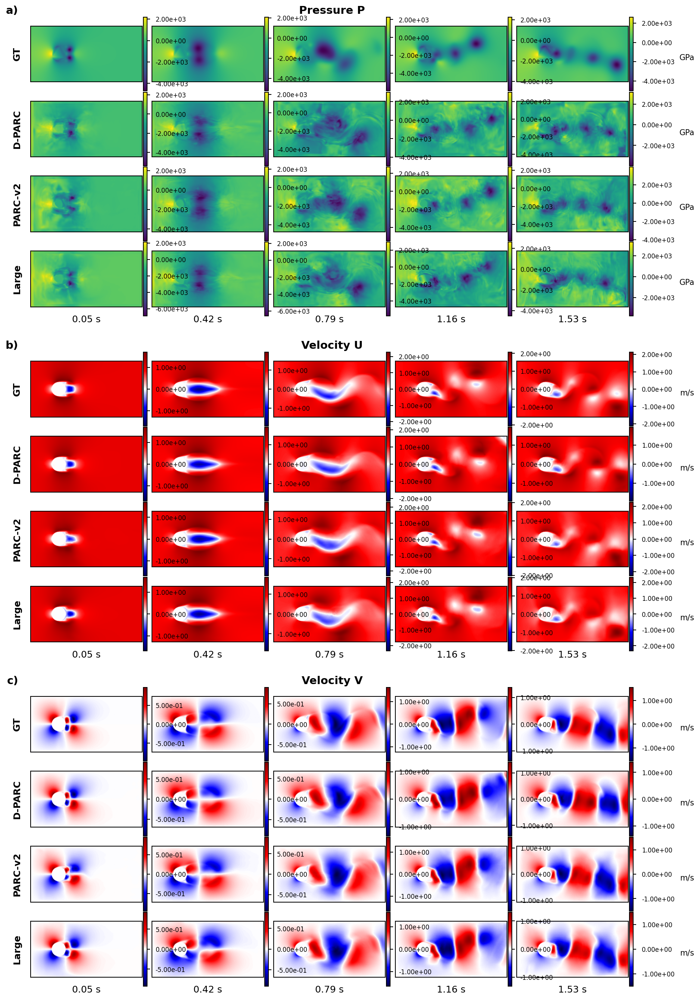


✓ Visualization complete!


In [17]:
################################################################################
# CELL 7: Task 2 - Generate Visualizations (Corrected for Sample Selection)
################################################################################

# --- Imports for this cell (assuming they are available) ---
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.gridspec as gridspec
from pathlib import Path
import os
import torch 
SAMPLE_ID_TO_COMPARE = 8
# --- 7a. Load Data for Visualization ---
print("Loading evaluation dataset for visualization...")
eval_dataset = GenericPhysicsDataset(
    data_dirs=[EVAL_DATA_DIR],
    future_steps=FUTURE_STEPS,
    min_max_path=MIN_MAX_PATH
)
# We need the loader just for the collate_fn
eval_loader = DataLoader(
    eval_dataset,
    batch_size=BATCH_SIZE, # BATCH_SIZE is still needed by the collate_fn
    shuffle=False,
    num_workers=1,
    pin_memory=True if DEVICE == 'cuda' else False,
    collate_fn=custom_collate_fn
)
print(f"✓ Dataset loaded. Total samples: {len(eval_dataset)}")

# --- 7b. Run Predictions for Visualization (Corrected) ---
# --- KEY CHANGE: Load the specific sample, not the first batch ---
print(f"Loading SPECIFIC sample {SAMPLE_ID_TO_COMPARE} for visualization...")

if SAMPLE_ID_TO_COMPARE >= len(eval_dataset):
    print(f"⚠️ SAMPLE_ID_TO_COMPARE ({SAMPLE_ID_TO_COMPARE}) is out of dataset range! Defaulting to sample 0.")
    SAMPLE_ID_TO_COMPARE = 0

# Get the specific sample AND create a batch of size 1
sample_data = eval_dataset[SAMPLE_ID_TO_COMPARE]
batch = custom_collate_fn([sample_data]) # Use collate_fn to build a batch of size 1

print("Running predictions on the single sample...")
ic, t0, t1, ground_truth = batch

ic = ic.to(DEVICE)
t0 = t0.to(DEVICE)
t1 = t1.to(DEVICE)
ground_truth = ground_truth.to(DEVICE)

with torch.no_grad():
    pred_deform = model_deform(ic, t0, t1)
    pred_standard = model_standard(ic, t0, t1)
    pred_large = model_large(ic, t0, t1)

print(f"✓ Predictions complete")

# --- 7c. Check Alignment ---
print("\n" + "="*80)
print("CHECKING DATA ALIGNMENT")
print(f"IC shape: {ic.shape}, Ground truth shape: {ground_truth.shape}")
ic_matches_gt0 = torch.allclose(ic[0], ground_truth[0, 0], atol=1e-6)
print(f"Does IC match GT[0]? {ic_matches_gt0}")
if ic_matches_gt0:
    print("✓ Ground truth INCLUDES t=0. Alignment: pred[t] ↔ gt[t+1]")
else:
    print("✓ Ground truth EXCLUDES t=0. Alignment: pred[t] ↔ gt[t]")
print("="*80 + "\n")

# --- 7d. Organize Data for Plotting (Corrected) ---
data_to_plot = {}

# --- KEY CHANGE ---
# The batch (ground_truth, pred_deform, etc.) now has ONLY ONE sample.
# We MUST use index 0 to select it.
sample_idx_in_batch = 0 

for feature_name, channel_idx in VIZ_CHANNEL_MAP.items(): # Using VIZ_CHANNEL_MAP
    data_to_plot[feature_name] = {}
    
    for ts in TIMESTEPS_TO_COMPARE:
        if ts >= ground_truth.shape[0]:
            print(f"⚠️ Timestep {ts} out of range, skipping...")
            continue
            
        # --- Use sample_idx_in_batch (which is 0) to index the batch ---
        gt_data = ground_truth[ts, sample_idx_in_batch, channel_idx, :, :].cpu()
        pred_deform_data = pred_deform[ts, sample_idx_in_batch, channel_idx, :, :].cpu()
        pred_standard_data = pred_standard[ts, sample_idx_in_batch, channel_idx, :, :].cpu()
        pred_large_data = pred_large[ts, sample_idx_in_batch, channel_idx, :, :].cpu()
        
        # Denormalize
        gt_denorm = denormalize(channel_idx, gt_data, norm_params).numpy()
        pred_deform_denorm = denormalize(channel_idx, pred_deform_data, norm_params).numpy()
        pred_standard_denorm = denormalize(channel_idx, pred_standard_data, norm_params).numpy()
        pred_large_denorm = denormalize(channel_idx, pred_large_data, norm_params).numpy()
        
        data_to_plot[feature_name][ts] = {
            'ground_truth': gt_denorm,
            'deform': pred_deform_denorm,
            'standard': pred_standard_denorm,
            'large': pred_large_denorm,
        }

# This print statement now correctly refers to the global sample ID
print(f"✓ Data organized for plotting Sample {SAMPLE_ID_TO_COMPARE}")

# --- 7e. Plotting Functions ---
def set_publication_style():
    """Set publication-quality matplotlib style parameters."""
    plt.rcParams.update({
        'font.family': 'DejaVu Sans', 'font.size': 6,
        'axes.labelsize': 6, 'axes.titlesize': 6,
        'xtick.labelsize': 5, 'ytick.labelsize': 5,
        'legend.fontsize': 5, 'figure.dpi': 300,
        'savefig.dpi': 300, 'savefig.bbox': 'tight',
        'savefig.pad_inches': 0.05, 'axes.linewidth': 0.5,
        'grid.linewidth': 0.5, 'lines.linewidth': 1.0,
        'patch.linewidth': 0.5, 'xtick.major.width': 0.5,
        'ytick.major.width': 0.5,
    })

# --- 7f. Generate Plot ---
print("Generating plot with individual color scales...")
if not data_to_plot:
    print("⚠️ The `data_to_plot` dictionary is empty.")
else:
    set_publication_style()
    
    features = list(VIZ_CHANNEL_MAP.keys())
    timesteps = TIMESTEPS_TO_COMPARE
    num_features = len(features)
    num_timesteps = len(timesteps)
    
    # ========== CREATE FIGURE ==========
    print("Using individual color scales for each subplot...")
    
    fig_width_mm = 180
    fig_width_in = fig_width_mm / 25.4
    panel_aspect_ratio = 2.0
    panel_width_in = fig_width_in / (num_timesteps + 0.5)
    panel_height_in = panel_width_in / panel_aspect_ratio
    fig_height_in = (4 * panel_height_in + 0.4) * num_features
    
    fig = plt.figure(figsize=(fig_width_in, fig_height_in))
    
    gs_outer = gridspec.GridSpec(
        num_features, 1, figure=fig, hspace=0.08,
        top=0.99, bottom=0.01, left=0.12, right=0.88
    )
    
    all_axes = []
    subfig_labels = ['a', 'b', 'c', 'd', 'e', 'f']
    
    for i, feature in enumerate(features):
        gs_inner = gridspec.GridSpecFromSubplotSpec(
            5, num_timesteps, subplot_spec=gs_outer[i], 
            hspace=0.02, wspace=0.04, height_ratios=[0.14, 1, 1, 1, 1]
        )
        
        # Feature title
        title_ax = fig.add_subplot(gs_inner[0, :])
        title_ax.text(-0.02, 0.5, f"{subfig_labels[i]})", fontsize=7, weight='bold', 
                        va='center', ha='right', transform=title_ax.transAxes)
        title_ax.text(0.5, 0.5, feature, fontsize=7, weight='bold', 
                        va='center', ha='center', transform=title_ax.transAxes)
        title_ax.axis('off')
        
        plot_axes = np.array([
            fig.add_subplot(gs_inner[r+1, c]) 
            for r in range(4) 
            for c in range(num_timesteps)
        ]).reshape(4, num_timesteps)
        all_axes.extend(plot_axes.flatten())
        
        cmap = CMAP_CONFIG[feature]['cmap']
        cbar_label = CMAP_CONFIG[feature]['label']
        
        row_names = ['ground_truth', 'deform', 'standard', 'large']
        row_labels = ['GT', 'D-PARC', 'PARC-v2', 'Large']
        
        for row_idx, (row_name, row_label) in enumerate(zip(row_names, row_labels)):
            
            for j, ts in enumerate(timesteps):
                if row_idx == 3:
                    time_seconds = (ts + 1) * TIME_PER_STEP
                    plot_axes[row_idx, j].text(0.5, -0.15, f"{time_seconds:.2f} s", fontsize=6, 
                                                ha='center', va='top', transform=plot_axes[row_idx, j].transAxes)
                
                if j == 0:
                    plot_axes[row_idx, 0].text(-0.08, 0.5, row_label, fontsize=6, weight='bold', 
                                                rotation=90, va='center', ha='right', transform=plot_axes[row_idx, 0].transAxes)
                
                if feature in data_to_plot and ts in data_to_plot[feature]:
                    grid = data_to_plot[feature][ts][row_name]
                    
                    # ========== INDIVIDUAL MIN/MAX FOR EACH SUBPLOT ==========
                    vmin = grid.min()
                    vmax = grid.max()
                    
                    # For diverging colormaps, use symmetric scale
                    if cmap == 'seismic':
                        abs_max = max(abs(vmin), abs(vmax))
                        vmin = -abs_max
                        vmax = abs_max
                    
                    im = plot_axes[row_idx, j].imshow(
                        grid, origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, 
                        interpolation='bilinear', aspect='equal'
                    )
                    plot_axes[row_idx, j].set_aspect('equal', adjustable='box')
                    
                    # Add colorbar for each subplot
                    cbar = fig.colorbar(im, ax=plot_axes[row_idx, j], pad=0.01, aspect=20, 
                                        fraction=0.035, format='%.2e')
                    cbar.ax.tick_params(labelsize=4, width=0.5, length=2)
                    cbar.outline.set_linewidth(0.5)
                    if cbar_label and j == num_timesteps - 1: # Only show label on rightmost colorbar
                        cbar.set_label(cbar_label, rotation=0, labelpad=8, fontsize=5)
    
    for ax in all_axes:
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_linewidth(0.5)
    
    # Save figure
    output_filename = os.path.join(OUTPUT_DIR, f"ns_comparison_three_models_sample{SAMPLE_ID_TO_COMPARE}_individual_scale.pdf")
    plt.savefig(output_filename, bbox_inches='tight', pad_inches=0.02, dpi=300)
    print(f"✓ Figure saved as: {output_filename}")
    
    output_filename_png = output_filename.replace('.pdf', '.png')
    plt.savefig(output_filename_png, bbox_inches='tight', pad_inches=0.02, dpi=300)
    print(f"✓ Figure saved as: {output_filename_png}")
    
    plt.show()

print("\n" + "="*80)
print("✓ Visualization complete!")
print("="*80)

Loading evaluation dataset...


Listing samples: 100%|██████████| 13/13 [00:00<00:00, 21.04it/s]


✓ Dataset loaded. Total samples: 13
Loading SPECIFIC sample 8 for visualization...
Running predictions on the single sample...
✓ Predictions complete

CHECKING DATA ALIGNMENT
IC shape: torch.Size([1, 4, 128, 256]), Ground truth shape: torch.Size([38, 1, 4, 128, 256])
Does IC match GT[0]? False
✓ Ground truth EXCLUDES t=0. Alignment: pred[t] ↔ gt[t]

Organizing data for plotting...
Processing Velocity Magnitude...
Processing Pressure P...
✓ Data organized for plotting Sample 8
Added default CMAP_CONFIG for 'Velocity Magnitude'
Original features processed: ['Velocity Magnitude', 'Pressure P']
Features to be plotted: ['Velocity Magnitude', 'Pressure P']

Generating plot...


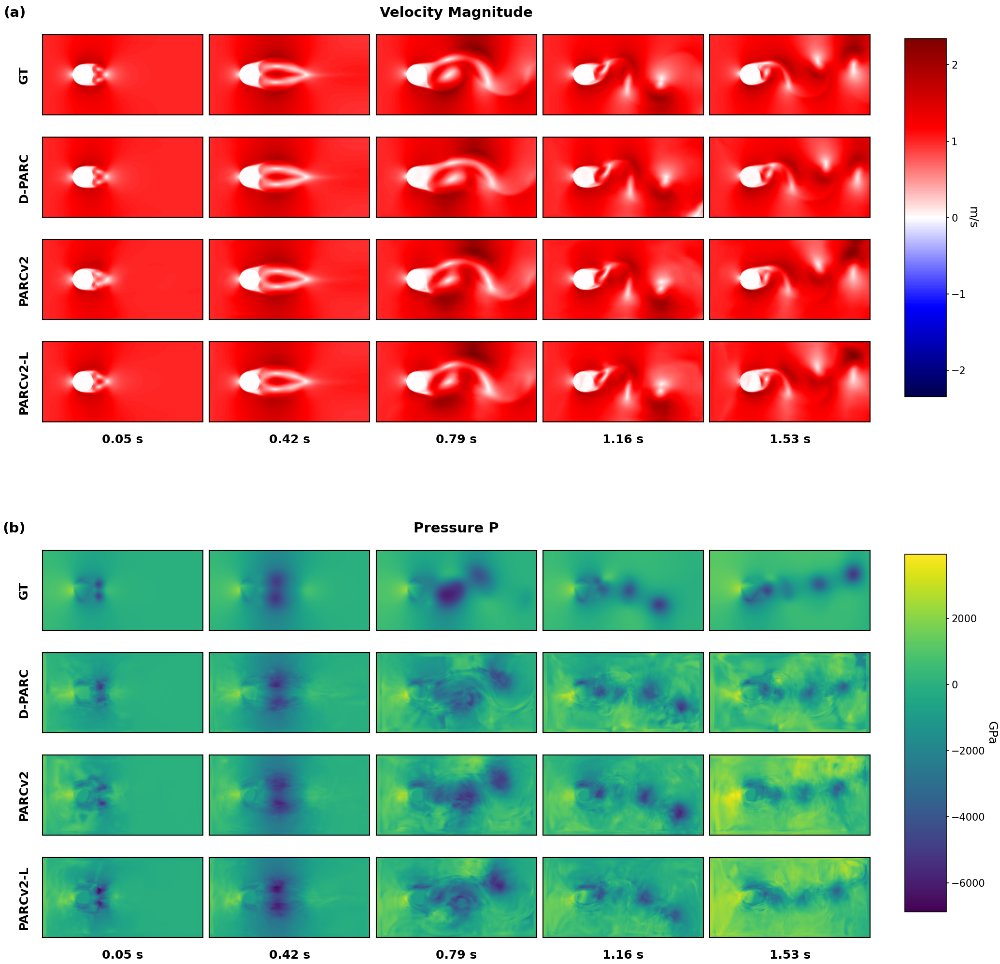

✓ Plot saved as PDF: ../results/comparison_ns/ns_comparison_vel_pressure_sample8.pdf
✓ Plot saved as PNG: ../results/comparison_ns/ns_comparison_vel_pressure_sample8.png

✓ Visualization complete!


In [18]:
################################################################################
# CELL 7 (Combined): Data Prep, Styling, and Visualization
# (Navier-Stokes Data, Burgers-Style Formatting, Vel/Pressure Only)
# (FIX: Added flexible filter for 'Pressure P')
################################################################################

# --- Imports for this cell ---
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.gridspec as gridspec
from pathlib import Path
import os
import torch  # Assuming torch was imported in an earlier cell

# --- Set the sample you want from the *entire* dataset ---
# You can change this ID to plot a different sample (e.g., 0-12)
SAMPLE_ID_TO_COMPARE = 8 # Will load sample 8 (since 121 was out of range)

# --- 7a. Load Data for Visualization (Corrected) ---
print("Loading evaluation dataset...")
eval_dataset = GenericPhysicsDataset(
    data_dirs=[EVAL_DATA_DIR],
    future_steps=FUTURE_STEPS,
    min_max_path=MIN_MAX_PATH
)
# We need the collate_fn to manually build a batch
eval_loader = DataLoader(
    eval_dataset,
    batch_size=BATCH_SIZE, # BATCH_SIZE is still needed by the collate_fn
    shuffle=False,
    num_workers=1,
    pin_memory=True if DEVICE == 'cuda' else False,
    collate_fn=custom_collate_fn
)
print(f"✓ Dataset loaded. Total samples: {len(eval_dataset)}")

# --- 7b. Run Predictions for Visualization (Corrected) ---
print(f"Loading SPECIFIC sample {SAMPLE_ID_TO_COMPARE} for visualization...")

if SAMPLE_ID_TO_COMPARE >= len(eval_dataset):
    print(f"⚠️ SAMPLE_ID_TO_COMPARE ({SAMPLE_ID_TO_COMPARE}) is out of dataset range! Defaulting to sample 0.")
    SAMPLE_ID_TO_COMPARE = 0

# --- KEY CHANGE: Get the specific sample AND create a batch of size 1 ---
sample_data = eval_dataset[SAMPLE_ID_TO_COMPARE]
batch = custom_collate_fn([sample_data]) # Use collate_fn to build a batch of size 1

print("Running predictions on the single sample...")
ic, t0, t1, ground_truth = batch

ic = ic.to(DEVICE)
t0 = t0.to(DEVICE)
t1 = t1.to(DEVICE)
ground_truth = ground_truth.to(DEVICE)

with torch.no_grad():
    pred_deform = model_deform(ic, t0, t1)
    pred_standard = model_standard(ic, t0, t1)
    pred_large = model_large(ic, t0, t1)

print(f"✓ Predictions complete")

# --- 7c. Check Alignment ---
print("\n" + "="*80)
print("CHECKING DATA ALIGNMENT")
print(f"IC shape: {ic.shape}, Ground truth shape: {ground_truth.shape}")
ic_matches_gt0 = torch.allclose(ic[0], ground_truth[0, 0], atol=1e-6)
print(f"Does IC match GT[0]? {ic_matches_gt0}")
if ic_matches_gt0:
    print("✓ Ground truth INCLUDES t=0. Alignment: pred[t] ↔ gt[t+1]")
else:
    print("✓ Ground truth EXCLUDES t=0. Alignment: pred[t] ↔ gt[t]")
print("="*80 + "\n")


# --- 7e (Refactored): Plotting Style Function (Using 'Arial' from learned script) ---
def set_publication_style():
    """Set publication-quality matplotlib style parameters."""
    plt.rcParams.update({
        'font.family': 'DejaVu Sans',
        'font.size': 6,
        'axes.labelsize': 6,
        'axes.titlesize': 7,
        'xtick.labelsize': 5,
        'ytick.labelsize': 5,
        'legend.fontsize': 5,
        'figure.dpi': 300,
        'savefig.dpi': 300,
        'savefig.bbox': 'tight',
        'savefig.pad_inches': 0.02,
        'axes.linewidth': 0.5,
        'xtick.major.width': 0.5,
        'ytick.major.width': 0.5,
    })

# --- 7d (Refactored): Organize Data for Plotting (Corrected) ---
print("Organizing data for plotting...")
data_to_plot = {}
features_to_plot = [] # Will be auto-populated
models_to_plot = ['ground_truth', 'deform', 'standard', 'large']

# The batch (ground_truth, pred_deform) now has ONLY ONE sample.
# We MUST use index 0 to select it.
sample_idx_in_batch = 0 

# --- Check for and process Velocity Magnitude ---
has_vel_u = 'Velocity U' in VIZ_CHANNEL_MAP
has_vel_v = 'Velocity V' in VIZ_CHANNEL_MAP

if has_vel_u and has_vel_v:
    feature_name = 'Velocity Magnitude'
    features_to_plot.append(feature_name)
    data_to_plot[feature_name] = {ts: {} for ts in TIMESTEPS_TO_COMPARE}
    
    u_idx = VIZ_CHANNEL_MAP['Velocity U']
    v_idx = VIZ_CHANNEL_MAP['Velocity V']
    
    print(f"Processing {feature_name}...")
    for ts in TIMESTEPS_TO_COMPARE:
        if ts >= ground_truth.shape[0]:
            print(f"⚠️ Timestep {ts} out of range, skipping...")
            continue
            
        for model_name, pred_tensor in zip(models_to_plot, [ground_truth, pred_deform, pred_standard, pred_large]):
            
            if model_name == 'ground_truth':
                u_data = pred_tensor[ts, sample_idx_in_batch, u_idx, :, :].cpu()
                v_data = pred_tensor[ts, sample_idx_in_batch, v_idx, :, :].cpu()
            else:
                u_data = pred_tensor[ts, sample_idx_in_batch, u_idx, :, :].cpu()
                v_data = pred_tensor[ts, sample_idx_in_batch, v_idx, :, :].cpu()

            u_denorm = denormalize(u_idx, u_data, norm_params).numpy()
            v_denorm = denormalize(v_idx, v_data, norm_params).numpy()
            magnitude = np.sqrt(u_denorm**2 + v_denorm**2)
            data_to_plot[feature_name][ts][model_name] = magnitude

# --- Process all other features (including Pressure P) ---
for feature_name, channel_idx in VIZ_CHANNEL_MAP.items():
    if feature_name in ['Velocity U', 'Velocity V']:
        continue  

    print(f"Processing {feature_name}...")
    features_to_plot.append(feature_name)
    data_to_plot[feature_name] = {ts: {} for ts in TIMESTEPS_TO_COMPARE}
    
    for ts in TIMESTEPS_TO_COMPARE:
        if ts >= ground_truth.shape[0]:
            print(f"⚠️ Timestep {ts} out of range, skipping...")
            continue
            
        for model_name, pred_tensor in zip(models_to_plot, [ground_truth, pred_deform, pred_standard, pred_large]):
            
            if model_name == 'ground_truth':
                data = pred_tensor[ts, sample_idx_in_batch, channel_idx, :, :].cpu()
            else:
                data = pred_tensor[ts, sample_idx_in_batch, channel_idx, :, :].cpu()
                
            denorm_data = denormalize(channel_idx, data, norm_params).numpy()
            data_to_plot[feature_name][ts][model_name] = denorm_data

print(f"✓ Data organized for plotting Sample {SAMPLE_ID_TO_COMPARE}")

# --- IMPORTANT: Update CMAP_CONFIG for Velocity Magnitude ---
if 'Velocity Magnitude' not in CMAP_CONFIG:
    CMAP_CONFIG['Velocity Magnitude'] = {'cmap': 'seismic', 'label': 'm/s'}
    print("Added default CMAP_CONFIG for 'Velocity Magnitude'")
if 'Velocity U' in CMAP_CONFIG:
    del CMAP_CONFIG['Velocity U']
if 'Velocity V' in CMAP_CONFIG:
    del CMAP_CONFIG['Velocity V']

# --- KEY CHANGE: Flexible filter for 'Pressure' or 'Pressure P' ---
print(f"Original features processed: {features_to_plot}")

desired_features_to_plot = []

# 1. Add Velocity Magnitude if it was processed
if 'Velocity Magnitude' in features_to_plot:
    desired_features_to_plot.append('Velocity Magnitude')

# 2. Find Pressure, 'Pressure P', or 'Pressure_P'
pressure_found = False
# Check for the exact names you might be using
for pressure_name in ['Pressure', 'Pressure P', 'Pressure_P', 'pressure', 'pressure_p']:
    if pressure_name in features_to_plot:
        desired_features_to_plot.append(pressure_name)
        pressure_found = True
        break # Found one, stop looking

if not pressure_found:
    print("⚠️ Warning: Could not find 'Pressure' or 'Pressure P' in processed features.")

features_to_plot = desired_features_to_plot # Overwrite with our filtered list
# --- End of new filter ---

print(f"Features to be plotted: {features_to_plot}")


# --- 7f (Refactored): Generate Plot ---
print("\nGenerating plot...")
if not data_to_plot or not features_to_plot:
    print("⚠️ The `data_to_plot` dictionary is empty or desired features were not found.")
else:
    set_publication_style()
    
    features = features_to_plot  # This is now the filtered list
    timesteps = TIMESTEPS_TO_COMPARE
    num_features = len(features)
    num_timesteps = len(timesteps)
    
    row_names = ['ground_truth', 'deform', 'standard', 'large']
    row_labels = ['GT', 'D-PARC', 'PARCv2', 'PARCv2-L']
    num_models = len(row_names)
    
    # --- Figure Sizing ---
    first_grid = next(iter(next(iter(data_to_plot.values())).values()))['ground_truth']
    ny, nx = first_grid.shape
    data_aspect_ratio = ny / nx

    fig_width_mm = 180
    fig_width_in = fig_width_mm / 25.4
    
    panel_height_in = (fig_width_in / num_timesteps) * data_aspect_ratio
    fig_height_in = panel_height_in * (num_models + 0.5) * num_features * 1.1 
    
    fig = plt.figure(figsize=(fig_width_in, fig_height_in))
    
    # --- Outer GridSpec ---
    outer_gs = gridspec.GridSpec(
        num_features, 2, figure=fig,
        width_ratios=[1, 0.05], # Plot column, Cbar column
        wspace=0.08, hspace=0.2, # hspace between feature blocks
        top=0.98, bottom=0.05, left=0.1, right=0.98
    )
    
    subfig_labels = ['a', 'b', 'c', 'd', 'e', 'f']
    
    for i, feature in enumerate(features):
        
        # --- Determine vmin/vmax for the *entire feature block* ---
        all_grids = []
        for ts in timesteps:
            if ts not in data_to_plot[feature]: continue
            for model_name in row_names:
                if model_name in data_to_plot[feature][ts]:
                    all_grids.append(data_to_plot[feature][ts][model_name])
        
        if not all_grids:
            print(f"⚠️ No data found for feature {feature}, skipping block.")
            continue
            
        vmin = min(g.min() for g in all_grids)
        vmax = max(g.max() for g in all_grids)
        
        # Symmetrize color bar if 'seismic'
        if CMAP_CONFIG[feature]['cmap'] == 'seismic':
            abs_max = max(abs(vmin), abs(vmax))
            vmin = -abs_max
            vmax = abs_max

        cmap = CMAP_CONFIG[feature]['cmap']
        cbar_label = CMAP_CONFIG[feature]['label']
        
        # --- Inner GridSpec (for title + model rows) ---
        inner_gs_spec = outer_gs[i, 0]
        inner_gs = gridspec.GridSpecFromSubplotSpec(
            num_models + 1, num_timesteps, subplot_spec=inner_gs_spec,
            height_ratios=[0.2] + [1] * num_models, # Title row + Model rows
            hspace=0.02, wspace=0.04
        )
        
        # --- Feature Title ---
        title_ax = fig.add_subplot(inner_gs[0, :])
        
        # (a) Subfigure label (from 'learned' style)
        title_ax.text(-0.02, 0.5, f"({subfig_labels[i]})",
                      fontsize=7, weight='bold',
                      rotation=0, va='center', ha='right',
                      transform=title_ax.transAxes)
        
        # Feature name
        feature_display = feature.replace('_', ' ').title()
        title_ax.text(0.5, 0.5, feature_display,
                      fontsize=7, weight='bold',
                      va='center', ha='center',
                      transform=title_ax.transAxes)
        title_ax.axis('off')

        # --- Plotting Loop (Models x Timesteps) ---
        im = None 
        for row_idx, (row_name, row_label) in enumerate(zip(row_names, row_labels)):
            for j, ts in enumerate(timesteps):
                ax = fig.add_subplot(inner_gs[row_idx + 1, j])
                
                if ts in data_to_plot[feature] and row_name in data_to_plot[feature][ts]:
                    grid = data_to_plot[feature][ts][row_name]
                    im = ax.imshow(
                        grid, cmap=cmap, vmin=vmin, vmax=vmax,
                        interpolation='bilinear', aspect='equal', origin='upper' # Changed origin to 'upper'
                    )
                else:
                    ax.text(0.5, 0.5, 'No Data', ha='center', va='center', 
                            transform=ax.transAxes, fontsize=5)

                # --- Labels ---
                if row_idx == num_models - 1: # Time labels (bottom row only)
                    time_seconds = (ts + 1) * TIME_PER_STEP 
                    ax.text(0.5, -0.15, f"{time_seconds:.2f} s", fontsize=6,
                            ha='center', va='top', transform=ax.transAxes,
                            weight='bold')
                
                if j == 0: # Row (Model) labels (first column only)
                    ax.text(-0.08, 0.5, row_label, fontsize=6, weight='bold',
                            rotation=90, va='center', ha='right',
                            transform=ax.transAxes)
                
                ax.set_xticks([])
                ax.set_yticks([])

        # --- Colorbar (Shorter) ---
        if im:
            cbar_gs = gridspec.GridSpecFromSubplotSpec(
                3, 1, subplot_spec=outer_gs[i, 1],
                height_ratios=[0.1, 1, 0.1], # Top empty, cbar, bottom empty
                hspace=0 
            )
            cax = fig.add_subplot(cbar_gs[1, 0]) # Place colorbar in middle slot

            cbar = plt.colorbar(im, cax=cax, aspect=15) 
            cbar.ax.tick_params(labelsize=5, width=0.4, length=1.5, pad=1)
            cbar.outline.set_linewidth(0.4)
            if cbar_label:
                cbar.set_label(cbar_label, rotation=270, labelpad=6, fontsize=6)

    # --- Save the figure ---
    output_dir = Path(OUTPUT_DIR)
    output_dir.mkdir(exist_ok=True)
    
    # New filename for this specific plot
    pdf_path = output_dir / f"ns_comparison_vel_pressure_sample{SAMPLE_ID_TO_COMPARE}.pdf"
    png_path = output_dir / f"ns_comparison_vel_pressure_sample{SAMPLE_ID_TO_COMPARE}.png"

    plt.savefig(pdf_path)
    plt.savefig(png_path)
    plt.show()
    plt.close(fig)

    print(f"✓ Plot saved as PDF: {pdf_path}")
    print(f"✓ Plot saved as PNG: {png_path}")

print("\n" + "="*80)
print("✓ Visualization complete!")
print("="*80)

In [19]:
################################################################################
# CELL 8: Find All Test Files (for Metrics)
################################################################################

test_files = sorted(glob.glob(os.path.join(EVAL_DATA_DIR, '*.npy')))
print(f"Found {len(test_files)} simulation files for metrics calculation.")

Found 13 simulation files for metrics calculation.


In [20]:
################################################################################
# CELL 9: Task 3 - Calculate Global RMSE + SSIM
################################################################################

from skimage.metrics import structural_similarity as ssim_sk  # NEW

print("\n" + "="*80)
print("COMPUTING PER-CHANNEL GLOBAL RMSE + SSIM")
print("="*80)

# Initialize accumulators for all three models
squared_error_sum_deform_norm = {}
squared_error_sum_standard_norm = {}
squared_error_sum_large_norm = {}
squared_error_sum_deform_denorm = {}
squared_error_sum_standard_denorm = {}
squared_error_sum_large_denorm = {}
element_count = {}

# NEW: SSIM accumulators
ssim_sum_deform = {}
ssim_sum_standard = {}
ssim_sum_large = {}
ssim_frame_count = {}

for feature_name in METRICS_CHANNEL_MAP.keys():
    squared_error_sum_deform_norm[feature_name] = 0.0
    squared_error_sum_standard_norm[feature_name] = 0.0
    squared_error_sum_large_norm[feature_name] = 0.0
    squared_error_sum_deform_denorm[feature_name] = 0.0
    squared_error_sum_standard_denorm[feature_name] = 0.0
    squared_error_sum_large_denorm[feature_name] = 0.0
    element_count[feature_name] = 0
    # NEW
    ssim_sum_deform[feature_name] = 0.0
    ssim_sum_standard[feature_name] = 0.0
    ssim_sum_large[feature_name] = 0.0
    ssim_frame_count[feature_name] = 0

# NEW: helper for SSIM on a [T, H, W] field pair
def compute_ssim_series(pred_field, gt_field):
    pred_np = pred_field.detach().cpu().numpy()
    gt_np = gt_field.detach().cpu().numpy()
    data_range = gt_np.max() - gt_np.min()
    if data_range == 0:
        data_range = 1e-8
    frame_ssims = [
        ssim_sk(gt_np[t], pred_np[t], data_range=data_range)
        for t in range(pred_np.shape[0])
    ]
    return float(np.mean(frame_ssims))

for file_idx, test_file in enumerate(test_files):
    progress = (file_idx + 1) / len(test_files)
    bar_length = 40
    filled_length = int(bar_length * progress)
    bar = '█' * filled_length + '-' * (bar_length - filled_length)
    print(f'\rProcessing: |{bar}| {file_idx + 1}/{len(test_files)} ({progress:.1%})', end='', flush=True)
    
    full_sim = np.load(test_file)
    full_sim_tensor = torch.from_numpy(full_sim).float().to(DEVICE)
    
    normalized_sim = torch.zeros_like(full_sim_tensor)
    for ch in range(full_sim_tensor.shape[1]):
        channel_min = norm_params["channel_min"][ch]
        channel_max = norm_params["channel_max"][ch]
        normalized_sim[:, ch, :, :] = (full_sim_tensor[:, ch, :, :] - channel_min) / (channel_max - channel_min)
    
    ic = normalized_sim[0:1, :, :, :]
    num_steps_to_predict = min(FUTURE_STEPS, full_sim_tensor.shape[0] - 1)
    t0 = torch.tensor(0.0, device=DEVICE)
    t1 = torch.arange(1, num_steps_to_predict + 1, dtype=torch.float32, device=DEVICE) / num_steps_to_predict
    ground_truth_file = normalized_sim[1:num_steps_to_predict+1, :, :, :].unsqueeze(1)
    
    with torch.no_grad():
        pred_deform_file = model_deform(ic, t0, t1)
        pred_standard_file = model_standard(ic, t0, t1)
        pred_large_file = model_large(ic, t0, t1)
    
    min_len = min(pred_deform_file.shape[0], ground_truth_file.shape[0])
    pred_deform_aligned = pred_deform_file[:min_len]
    pred_standard_aligned = pred_standard_file[:min_len]
    pred_large_aligned = pred_large_file[:min_len]
    gt_aligned = ground_truth_file[:min_len]
    
    for feature_name, channel_idx in METRICS_CHANNEL_MAP.items():
        if isinstance(channel_idx, tuple):
            # VELOCITY MAGNITUDE - uses two channels (u, v)
            ch_u, ch_v = channel_idx
            
            gt_u_norm = gt_aligned[:, 0, ch_u, :, :]
            gt_v_norm = gt_aligned[:, 0, ch_v, :, :]
            pred_d_u_norm = pred_deform_aligned[:, 0, ch_u, :, :]
            pred_d_v_norm = pred_deform_aligned[:, 0, ch_v, :, :]
            pred_s_u_norm = pred_standard_aligned[:, 0, ch_u, :, :]
            pred_s_v_norm = pred_standard_aligned[:, 0, ch_v, :, :]
            pred_l_u_norm = pred_large_aligned[:, 0, ch_u, :, :]
            pred_l_v_norm = pred_large_aligned[:, 0, ch_v, :, :]
            
            gt_vel_mag_norm = torch.sqrt(gt_u_norm**2 + gt_v_norm**2)
            pred_d_vel_mag_norm = torch.sqrt(pred_d_u_norm**2 + pred_d_v_norm**2)
            pred_s_vel_mag_norm = torch.sqrt(pred_s_u_norm**2 + pred_s_v_norm**2)
            pred_l_vel_mag_norm = torch.sqrt(pred_l_u_norm**2 + pred_l_v_norm**2)
            
            sq_err_d_norm = (pred_d_vel_mag_norm - gt_vel_mag_norm) ** 2
            sq_err_s_norm = (pred_s_vel_mag_norm - gt_vel_mag_norm) ** 2
            sq_err_l_norm = (pred_l_vel_mag_norm - gt_vel_mag_norm) ** 2
            
            squared_error_sum_deform_norm[feature_name] += torch.sum(sq_err_d_norm).item()
            squared_error_sum_standard_norm[feature_name] += torch.sum(sq_err_s_norm).item()
            squared_error_sum_large_norm[feature_name] += torch.sum(sq_err_l_norm).item()
            
            gt_u_denorm = denormalize(ch_u, gt_u_norm, norm_params)
            gt_v_denorm = denormalize(ch_v, gt_v_norm, norm_params)
            pred_d_u_denorm = denormalize(ch_u, pred_d_u_norm, norm_params)
            pred_d_v_denorm = denormalize(ch_v, pred_d_v_norm, norm_params)
            pred_s_u_denorm = denormalize(ch_u, pred_s_u_norm, norm_params)
            pred_s_v_denorm = denormalize(ch_v, pred_s_v_norm, norm_params)
            pred_l_u_denorm = denormalize(ch_u, pred_l_u_norm, norm_params)
            pred_l_v_denorm = denormalize(ch_v, pred_l_v_norm, norm_params)
            
            gt_vel_mag_denorm = torch.sqrt(gt_u_denorm**2 + gt_v_denorm**2)
            pred_d_vel_mag_denorm = torch.sqrt(pred_d_u_denorm**2 + pred_d_v_denorm**2)
            pred_s_vel_mag_denorm = torch.sqrt(pred_s_u_denorm**2 + pred_s_v_denorm**2)
            pred_l_vel_mag_denorm = torch.sqrt(pred_l_u_denorm**2 + pred_l_v_denorm**2)
            
            sq_err_d_denorm = (pred_d_vel_mag_denorm - gt_vel_mag_denorm) ** 2
            sq_err_s_denorm = (pred_s_vel_mag_denorm - gt_vel_mag_denorm) ** 2
            sq_err_l_denorm = (pred_l_vel_mag_denorm - gt_vel_mag_denorm) ** 2
            
            squared_error_sum_deform_denorm[feature_name] += torch.sum(sq_err_d_denorm).item()
            squared_error_sum_standard_denorm[feature_name] += torch.sum(sq_err_s_denorm).item()
            squared_error_sum_large_denorm[feature_name] += torch.sum(sq_err_l_denorm).item()
            
            element_count[feature_name] += gt_vel_mag_norm.numel()

            # NEW: SSIM on denormalized velocity magnitude field
            ssim_sum_deform[feature_name] += compute_ssim_series(pred_d_vel_mag_denorm, gt_vel_mag_denorm)
            ssim_sum_standard[feature_name] += compute_ssim_series(pred_s_vel_mag_denorm, gt_vel_mag_denorm)
            ssim_sum_large[feature_name] += compute_ssim_series(pred_l_vel_mag_denorm, gt_vel_mag_denorm)
            ssim_frame_count[feature_name] += 1
            
        else:
            # SCALAR CHANNELS - single channel (e.g., pressure, strain, etc.)
            ch = channel_idx
            
            gt_ch_norm = gt_aligned[:, 0, ch, :, :]
            pred_d_ch_norm = pred_deform_aligned[:, 0, ch, :, :]
            pred_s_ch_norm = pred_standard_aligned[:, 0, ch, :, :]
            pred_l_ch_norm = pred_large_aligned[:, 0, ch, :, :]
            
            # DEBUG: Print for first file and pressure channel
            if file_idx == 0 and feature_name.lower() == 'pressure':
                print(f"\n\n=== PRESSURE DEBUG (File {file_idx}) ===")
                print(f"Channel index: {ch}")
                print(f"GT Normalized - Min: {gt_ch_norm.min():.6f}, Max: {gt_ch_norm.max():.6f}, Mean: {gt_ch_norm.mean():.6f}")
                print(f"Pred (D-PARC) Normalized - Min: {pred_d_ch_norm.min():.6f}, Max: {pred_d_ch_norm.max():.6f}")
                print(f"Pred (PARC-v2) Normalized - Min: {pred_s_ch_norm.min():.6f}, Max: {pred_s_ch_norm.max():.6f}")
            
            sq_err_d_norm = (pred_d_ch_norm - gt_ch_norm) ** 2
            sq_err_s_norm = (pred_s_ch_norm - gt_ch_norm) ** 2
            sq_err_l_norm = (pred_l_ch_norm - gt_ch_norm) ** 2
            
            squared_error_sum_deform_norm[feature_name] += torch.sum(sq_err_d_norm).item()
            squared_error_sum_standard_norm[feature_name] += torch.sum(sq_err_s_norm).item()
            squared_error_sum_large_norm[feature_name] += torch.sum(sq_err_l_norm).item()
            
            gt_ch_denorm = denormalize(ch, gt_ch_norm, norm_params)
            pred_d_ch_denorm = denormalize(ch, pred_d_ch_norm, norm_params)
            pred_s_ch_denorm = denormalize(ch, pred_s_ch_norm, norm_params)
            pred_l_ch_denorm = denormalize(ch, pred_l_ch_norm, norm_params)
            
            # DEBUG: Print denormalized values for pressure
            if file_idx == 0 and feature_name.lower() == 'pressure':
                print(f"GT Denormalized - Min: {gt_ch_denorm.min():.2e}, Max: {gt_ch_denorm.max():.2e}, Mean: {gt_ch_denorm.mean():.2e}")
                print(f"Pred (D-PARC) Denormalized - Min: {pred_d_ch_denorm.min():.2e}, Max: {pred_d_ch_denorm.max():.2e}")
                print(f"Pred (PARC-v2) Denormalized - Min: {pred_s_ch_denorm.min():.2e}, Max: {pred_s_ch_denorm.max():.2e}")
                print(f"Normalization range - Min: {norm_params['channel_min'][ch]:.2e}, Max: {norm_params['channel_max'][ch]:.2e}")
            
            sq_err_d_denorm = (pred_d_ch_denorm - gt_ch_denorm) ** 2
            sq_err_s_denorm = (pred_s_ch_denorm - gt_ch_denorm) ** 2
            sq_err_l_denorm = (pred_l_ch_denorm - gt_ch_denorm) ** 2
            
            # DEBUG: Print squared errors for pressure
            if file_idx == 0 and feature_name.lower() == 'pressure':
                print(f"Squared Error (D-PARC) Denorm - Sum: {torch.sum(sq_err_d_denorm).item():.2e}, Mean: {torch.mean(sq_err_d_denorm).item():.2e}")
                print(f"Squared Error (PARC-v2) Denorm - Sum: {torch.sum(sq_err_s_denorm).item():.2e}, Mean: {torch.mean(sq_err_s_denorm).item():.2e}")
            
            squared_error_sum_deform_denorm[feature_name] += torch.sum(sq_err_d_denorm).item()
            squared_error_sum_standard_denorm[feature_name] += torch.sum(sq_err_s_denorm).item()
            squared_error_sum_large_denorm[feature_name] += torch.sum(sq_err_l_denorm).item()
            
            element_count[feature_name] += gt_ch_norm.numel()

            # NEW: SSIM on denormalized scalar field
            ssim_sum_deform[feature_name] += compute_ssim_series(pred_d_ch_denorm, gt_ch_denorm)
            ssim_sum_standard[feature_name] += compute_ssim_series(pred_s_ch_denorm, gt_ch_denorm)
            ssim_sum_large[feature_name] += compute_ssim_series(pred_l_ch_denorm, gt_ch_denorm)
            ssim_frame_count[feature_name] += 1

print("\n") # New line after progress bar

# --- Calculate and Print RMSE Results ---
print("\n" + "="*80)
print("PER-CHANNEL GLOBAL RMSE RESULTS (NORMALIZED)")
print("="*80)
print(f"{'Channel':<25} {'D-PARC RMSE':<15} {'PARC-v2 RMSE':<15} {'Large RMSE':<15} {'Best Model':<15}")
print("-" * 85)

channel_rmse_deform_norm = {}
channel_rmse_standard_norm = {}
channel_rmse_large_norm = {}
channel_rmse_deform_denorm = {}
channel_rmse_standard_denorm = {}
channel_rmse_large_denorm = {}
results_for_csv = []

for feature_name in METRICS_CHANNEL_MAP.keys():
    rmse_d_norm = np.sqrt(squared_error_sum_deform_norm[feature_name] / element_count[feature_name])
    rmse_s_norm = np.sqrt(squared_error_sum_standard_norm[feature_name] / element_count[feature_name])
    rmse_l_norm = np.sqrt(squared_error_sum_large_norm[feature_name] / element_count[feature_name])
    
    channel_rmse_deform_norm[feature_name] = rmse_d_norm
    channel_rmse_standard_norm[feature_name] = rmse_s_norm
    channel_rmse_large_norm[feature_name] = rmse_l_norm
    
    best_model_norm = "Large"
    if rmse_d_norm <= min(rmse_s_norm, rmse_l_norm): best_model_norm = "D-PARC"
    elif rmse_s_norm <= min(rmse_d_norm, rmse_l_norm): best_model_norm = "PARC-v2"
    
    print(f"{feature_name:<25} {rmse_d_norm:<15.10f} {rmse_s_norm:<15.10f} {rmse_l_norm:<15.10f} {best_model_norm:<15}")

print("\n" + "="*80)
print("PER-CHANNEL GLOBAL RMSE RESULTS (DENORMALIZED - PHYSICAL UNITS)")
print("="*80)
print(f"{'Channel':<25} {'D-PARC RMSE':<20} {'PARC-v2 RMSE':<20} {'Large RMSE':<20} {'Best':<15}")
print("-" * 100)

for feature_name in METRICS_CHANNEL_MAP.keys():
    rmse_d_denorm = np.sqrt(squared_error_sum_deform_denorm[feature_name] / element_count[feature_name])
    rmse_s_denorm = np.sqrt(squared_error_sum_standard_denorm[feature_name] / element_count[feature_name])
    rmse_l_denorm = np.sqrt(squared_error_sum_large_denorm[feature_name] / element_count[feature_name])
    
    channel_rmse_deform_denorm[feature_name] = rmse_d_denorm
    channel_rmse_standard_denorm[feature_name] = rmse_s_denorm
    channel_rmse_large_denorm[feature_name] = rmse_l_denorm

    best_model_denorm = "Large"
    if rmse_d_denorm <= min(rmse_s_denorm, rmse_l_denorm): best_model_denorm = "D-PARC"
    elif rmse_s_denorm <= min(rmse_d_denorm, rmse_l_denorm): best_model_denorm = "PARC-v2"
    
    units = METRICS_UNITS[feature_name]
    
    # ADDITIONAL DEBUG for pressure
    if feature_name.lower() == 'pressure':
        print(f"\n=== PRESSURE FINAL DEBUG ===")
        print(f"Total squared error sum (denorm): D-PARC={squared_error_sum_deform_denorm[feature_name]:.6e}, "
              f"PARC-v2={squared_error_sum_standard_denorm[feature_name]:.6e}")
        print(f"Element count: {element_count[feature_name]}")
        print(f"RMSE (denorm): D-PARC={rmse_d_denorm:.6e}, PARC-v2={rmse_s_denorm:.6e}, Large={rmse_l_denorm:.6e}\n")
    
    print(f"{feature_name:<25} {rmse_d_denorm:<20.6e} {rmse_s_denorm:<20.6e} {rmse_l_denorm:<20.6e} {best_model_denorm:<15}")
    print(f"{'  (' + units + ')':<25}")

# NEW: --- Calculate and Print SSIM Results ---
print("\n" + "="*80)
print("PER-CHANNEL MEAN SSIM (PHYSICAL FIELDS)")
print("="*80)
print(f"{'Channel':<25} {'D-PARC SSIM':<15} {'PARC-v2 SSIM':<15} {'Large SSIM':<15} {'Best Model':<15}")
print("-" * 85)

channel_ssim_deform = {}
channel_ssim_standard = {}
channel_ssim_large = {}

for feature_name in METRICS_CHANNEL_MAP.keys():
    n = ssim_frame_count[feature_name]
    mean_ssim_d = ssim_sum_deform[feature_name] / n
    mean_ssim_s = ssim_sum_standard[feature_name] / n
    mean_ssim_l = ssim_sum_large[feature_name] / n

    channel_ssim_deform[feature_name] = mean_ssim_d
    channel_ssim_standard[feature_name] = mean_ssim_s
    channel_ssim_large[feature_name] = mean_ssim_l

    best_model_ssim = "Large"
    if mean_ssim_d >= max(mean_ssim_s, mean_ssim_l): best_model_ssim = "D-PARC"
    elif mean_ssim_s >= max(mean_ssim_d, mean_ssim_l): best_model_ssim = "PARC-v2"

    print(f"{feature_name:<25} {mean_ssim_d:<15.4f} {mean_ssim_s:<15.4f} {mean_ssim_l:<15.4f} {best_model_ssim:<15}")

# --- Print Relative Improvements ---
print("\n" + "="*80)
print("RELATIVE IMPROVEMENTS (vs PARC-v2 baseline)")
print("="*80)
print(f"\n{'Channel':<25} {'Normalized Space':<30} {'Physical Units':<30}")
print(f"{'':25} {'D-PARC':<15} {'Large':<15} {'D-PARC':<15} {'Large':<15}")
print("-" * 85)

for feature_name in METRICS_CHANNEL_MAP.keys():
    rmse_d_norm = channel_rmse_deform_norm[feature_name]
    rmse_s_norm = channel_rmse_standard_norm[feature_name]
    rmse_l_norm = channel_rmse_large_norm[feature_name]
    improvement_d_norm = ((rmse_s_norm - rmse_d_norm) / rmse_s_norm) * 100
    improvement_l_norm = ((rmse_s_norm - rmse_l_norm) / rmse_s_norm) * 100
    
    rmse_d_denorm = channel_rmse_deform_denorm[feature_name]
    rmse_s_denorm = channel_rmse_standard_denorm[feature_name]
    rmse_l_denorm = channel_rmse_large_denorm[feature_name]
    improvement_d_denorm = ((rmse_s_denorm - rmse_d_denorm) / rmse_s_denorm) * 100
    improvement_l_denorm = ((rmse_s_denorm - rmse_l_denorm) / rmse_s_denorm) * 100
    
    print(f"{feature_name:<25} {improvement_d_norm:+.2f}%{'':<9} {improvement_l_norm:+.2f}%{'':<9} "
          f"{improvement_d_denorm:+.2f}%{'':<9} {improvement_l_denorm:+.2f}%")

    # Get best models for CSV
    best_model_norm = "Large"
    if rmse_d_norm <= min(rmse_s_norm, rmse_l_norm): best_model_norm = "D-PARC"
    elif rmse_s_norm <= min(rmse_d_norm, rmse_l_norm): best_model_norm = "PARC-v2"
        
    best_model_denorm = "Large"
    if rmse_d_denorm <= min(rmse_s_denorm, rmse_l_denorm): best_model_denorm = "D-PARC"
    elif rmse_s_denorm <= min(rmse_d_denorm, rmse_l_denorm): best_model_denorm = "PARC-v2"

    results_for_csv.append([
        feature_name, METRICS_UNITS[feature_name],
        f'{rmse_d_norm:.10f}', f'{rmse_s_norm:.10f}', f'{rmse_l_norm:.10f}',
        f'{rmse_d_denorm:.6e}', f'{rmse_s_denorm:.6e}', f'{rmse_l_denorm:.6e}',
        best_model_norm, best_model_denorm,
        f'{improvement_d_norm:+.2f}', f'{improvement_l_norm:+.2f}',
        f'{improvement_d_denorm:+.2f}', f'{improvement_l_denorm:+.2f}',
        f'{element_count[feature_name]}',
        f'{channel_ssim_deform[feature_name]:.4f}',    # NEW
        f'{channel_ssim_standard[feature_name]:.4f}',  # NEW
        f'{channel_ssim_large[feature_name]:.4f}',     # NEW
    ])

print("\n" + "="*80)

# --- Save RMSE + SSIM Results to CSV ---
csv_path = os.path.join(OUTPUT_DIR, 'per_channel_global_rmse.csv')
with open(csv_path, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow([
        'Channel', 'Units',
        'D-PARC_RMSE_Normalized', 'PARC-v2_RMSE_Normalized', 'Large_RMSE_Normalized',
        'D-PARC_RMSE_Physical', 'PARC-v2_RMSE_Physical', 'Large_RMSE_Physical',
        'Best_Model_Normalized', 'Best_Model_Physical',
        'D-PARC_Improvement_%_Norm', 'Large_Improvement_%_Norm',
        'D-PARC_Improvement_%_Physical', 'Large_Improvement_%_Physical',
        'Elements_Per_Channel',
        'D-PARC_SSIM', 'PARC-v2_SSIM', 'Large_SSIM',  # NEW
    ])
    writer.writerows(results_for_csv)

print(f"✓ RMSE + SSIM results saved to: {csv_path}")
print("✓ PER-CHANNEL GLOBAL RMSE + SSIM ANALYSIS COMPLETE!")
print("="*80)


COMPUTING PER-CHANNEL GLOBAL RMSE + SSIM
Processing: |███-------------------------------------| 1/13 (7.7%)

=== PRESSURE DEBUG (File 0) ===
Channel index: 1
GT Normalized - Min: 0.619287, Max: 0.666068, Mean: 0.638725
Pred (D-PARC) Normalized - Min: 0.611647, Max: 0.660623
Pred (PARC-v2) Normalized - Min: 0.609002, Max: 0.662697
GT Denormalized - Min: -3.57e+02, Max: 4.29e+02, Mean: -3.01e+01
Pred (D-PARC) Denormalized - Min: -4.85e+02, Max: 3.38e+02
Pred (PARC-v2) Denormalized - Min: -5.29e+02, Max: 3.73e+02
Normalization range - Min: -1.08e+04, Max: 6.04e+03
Squared Error (D-PARC) Denorm - Sum: 9.60e+09, Mean: 7.71e+03
Squared Error (PARC-v2) Denorm - Sum: 5.57e+09, Mean: 4.48e+03
Processing: |████████████████████████████████████████| 13/13 (100.0%)


PER-CHANNEL GLOBAL RMSE RESULTS (NORMALIZED)
Channel                   D-PARC RMSE     PARC-v2 RMSE    Large RMSE      Best Model     
-------------------------------------------------------------------------------------
Pressure     

In [30]:
################################################################################
# CELL 9D: Task 3D - Q-Q Plots (All fields in one image) 
#          + Extreme Value Analysis
################################################################################

import os
import csv
import numpy as np
import torch
import matplotlib.pyplot as plt

# ============================================================================
# CONFIG
# ============================================================================
# Caps total retained samples per feature across the whole test set, to keep
# memory and compute tractable. Set to None to keep every value.
MAX_SAMPLES_PER_FEATURE = 200_000

DATASET_TAG = "ns"  # <-- Dataset tag updated to Navier-Stokes

print("\n" + "="*80)
print(f"[{DATASET_TAG}] COLLECTING FIELD VALUES FOR Q-Q COMPARISON")
print("="*80)

# ============================================================================
# ACCUMULATORS
# ============================================================================
values_gt = {feature_name: [] for feature_name in METRICS_CHANNEL_MAP.keys()}
values_deform = {feature_name: [] for feature_name in METRICS_CHANNEL_MAP.keys()}
values_standard = {feature_name: [] for feature_name in METRICS_CHANNEL_MAP.keys()}
values_large = {feature_name: [] for feature_name in METRICS_CHANNEL_MAP.keys()}

# Per-file extreme-value tracking: GT max location + each model's value AT that location
extreme_records = {feature_name: [] for feature_name in METRICS_CHANNEL_MAP.keys()}

for file_idx, test_file in enumerate(test_files):
    progress = (file_idx + 1) / len(test_files)
    bar_length = 40
    filled_length = int(bar_length * progress)
    bar = '█' * filled_length + '-' * (bar_length - filled_length)
    print(f'\r[{DATASET_TAG}] Processing: |{bar}| {file_idx + 1}/{len(test_files)} ({progress:.1%})', end='', flush=True)

    full_sim = np.load(test_file)
    full_sim_tensor = torch.from_numpy(full_sim).float().to(DEVICE)

    normalized_sim = torch.zeros_like(full_sim_tensor)
    for ch in range(full_sim_tensor.shape[1]):
        channel_min = norm_params["channel_min"][ch]
        channel_max = norm_params["channel_max"][ch]
        normalized_sim[:, ch, :, :] = (full_sim_tensor[:, ch, :, :] - channel_min) / (channel_max - channel_min)

    ic = normalized_sim[0:1, :, :, :]
    num_steps_to_predict = min(FUTURE_STEPS, full_sim_tensor.shape[0] - 1)
    t0 = torch.tensor(0.0, device=DEVICE)
    t1 = torch.arange(1, num_steps_to_predict + 1, dtype=torch.float32, device=DEVICE) / num_steps_to_predict
    ground_truth_file = normalized_sim[1:num_steps_to_predict+1, :, :, :].unsqueeze(1)

    with torch.no_grad():
        pred_deform_file = model_deform(ic, t0, t1)
        pred_standard_file = model_standard(ic, t0, t1)
        pred_large_file = model_large(ic, t0, t1)

    min_len = min(pred_deform_file.shape[0], ground_truth_file.shape[0])
    pred_deform_aligned = pred_deform_file[:min_len]
    pred_standard_aligned = pred_standard_file[:min_len]
    pred_large_aligned = pred_large_file[:min_len]
    gt_aligned = ground_truth_file[:min_len]

    for feature_name, channel_idx in METRICS_CHANNEL_MAP.items():
        if isinstance(channel_idx, tuple):
            ch_u, ch_v = channel_idx

            gt_u_norm = gt_aligned[:, 0, ch_u, :, :]
            gt_v_norm = gt_aligned[:, 0, ch_v, :, :]
            pred_d_u_norm = pred_deform_aligned[:, 0, ch_u, :, :]
            pred_d_v_norm = pred_deform_aligned[:, 0, ch_v, :, :]
            pred_s_u_norm = pred_standard_aligned[:, 0, ch_u, :, :]
            pred_s_v_norm = pred_standard_aligned[:, 0, ch_v, :, :]
            pred_l_u_norm = pred_large_aligned[:, 0, ch_u, :, :]
            pred_l_v_norm = pred_large_aligned[:, 0, ch_v, :, :]

            gt_u_denorm = denormalize(ch_u, gt_u_norm, norm_params)
            gt_v_denorm = denormalize(ch_v, gt_v_norm, norm_params)
            pred_d_u_denorm = denormalize(ch_u, pred_d_u_norm, norm_params)
            pred_d_v_denorm = denormalize(ch_v, pred_d_v_norm, norm_params)
            pred_s_u_denorm = denormalize(ch_u, pred_s_u_norm, norm_params)
            pred_s_v_denorm = denormalize(ch_v, pred_s_v_norm, norm_params)
            pred_l_u_denorm = denormalize(ch_u, pred_l_u_norm, norm_params)
            pred_l_v_denorm = denormalize(ch_v, pred_l_v_norm, norm_params)

            gt_field = torch.sqrt(gt_u_denorm**2 + gt_v_denorm**2)
            pred_d_field = torch.sqrt(pred_d_u_denorm**2 + pred_d_v_denorm**2)
            pred_s_field = torch.sqrt(pred_s_u_denorm**2 + pred_s_v_denorm**2)
            pred_l_field = torch.sqrt(pred_l_u_denorm**2 + pred_l_v_denorm**2)
        else:
            ch = channel_idx
            gt_ch_norm = gt_aligned[:, 0, ch, :, :]
            pred_d_ch_norm = pred_deform_aligned[:, 0, ch, :, :]
            pred_s_ch_norm = pred_standard_aligned[:, 0, ch, :, :]
            pred_l_ch_norm = pred_large_aligned[:, 0, ch, :, :]

            gt_field = denormalize(ch, gt_ch_norm, norm_params)
            pred_d_field = denormalize(ch, pred_d_ch_norm, norm_params)
            pred_s_field = denormalize(ch, pred_s_ch_norm, norm_params)
            pred_l_field = denormalize(ch, pred_l_ch_norm, norm_params)

        # --- Flatten for distribution accumulation, with per-file subsampling cap ---
        gt_full = gt_field.detach().cpu().numpy()
        d_full = pred_d_field.detach().cpu().numpy()
        s_full = pred_s_field.detach().cpu().numpy()
        l_full = pred_l_field.detach().cpu().numpy()

        gt_np, d_np, s_np, l_np = gt_full.ravel(), d_full.ravel(), s_full.ravel(), l_full.ravel()

        if MAX_SAMPLES_PER_FEATURE is not None:
            per_file_cap = max(1, MAX_SAMPLES_PER_FEATURE // len(test_files))
            if gt_np.size > per_file_cap:
                idx = np.random.choice(gt_np.size, size=per_file_cap, replace=False)
                gt_np, d_np, s_np, l_np = gt_np[idx], d_np[idx], s_np[idx], l_np[idx]

        values_gt[feature_name].append(gt_np)
        values_deform[feature_name].append(d_np)
        values_standard[feature_name].append(s_np)
        values_large[feature_name].append(l_np)

        # --- Extreme-value tracking: use FULL (unsampled) field so the true GT max isn't missed ---
        flat_idx = np.argmax(gt_full)
        extreme_records[feature_name].append({
            'file': os.path.basename(test_file),
            'gt_max': gt_full.flat[flat_idx],
            'd_parc_at_gt_max_loc': d_full.flat[flat_idx],
            'parcv2_at_gt_max_loc': s_full.flat[flat_idx],
            'large_at_gt_max_loc': l_full.flat[flat_idx],
            'd_parc_own_max': d_full.max(),
            'parcv2_own_max': s_full.max(),
            'large_own_max': l_full.max(),
        })

print("\n")

# ============================================================================
# CONCATENATE
# ============================================================================
for feature_name in METRICS_CHANNEL_MAP.keys():
    values_gt[feature_name] = np.concatenate(values_gt[feature_name])
    values_deform[feature_name] = np.concatenate(values_deform[feature_name])
    values_standard[feature_name] = np.concatenate(values_standard[feature_name])
    values_large[feature_name] = np.concatenate(values_large[feature_name])

# ============================================================================
# PLOT: Q-Q PLOT COMPARISON (ALL FIELDS IN ONE FIGURE)
# ============================================================================
print("="*80)
print(f"[{DATASET_TAG}] GENERATING COMBINED Q-Q PLOTS")
print("="*80)

quantile_probs = np.concatenate([
    np.linspace(0.0, 0.90, 40),
    np.linspace(0.90, 0.999, 60),
    [0.9995, 0.9999, 1.0] 
])

features = list(METRICS_CHANNEL_MAP.keys())
num_features = len(features)

# Dynamically calculate grid layout (max 3 columns)
cols = min(3, num_features)
rows = (num_features + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
axes = np.atleast_1d(axes).flatten()

for idx, feature_name in enumerate(features):
    ax = axes[idx]
    units = METRICS_UNITS[feature_name] if 'METRICS_UNITS' in dir() else CHANNEL_UNITS[feature_name]

    data_series = {
        'DNS (Ground Truth)': values_gt[feature_name],
        'PARCv2': values_standard[feature_name],
        'PARCv2-L': values_large[feature_name],
        'D-PARC': values_deform[feature_name],
    }
    
    colors = {'DNS (Ground Truth)': 'black', 'PARCv2': 'tab:orange', 'PARCv2-L': 'tab:green', 'D-PARC': 'tab:blue'}
    linestyles = {'DNS (Ground Truth)': '-', 'PARCv2': '--', 'PARCv2-L': '--', 'D-PARC': '-'}

    gt_data = data_series['DNS (Ground Truth)']
    gt_quantiles = np.quantile(gt_data, quantile_probs)
    
    x_min = min(v.min() for v in data_series.values())
    x_max = max(v.max() for v in data_series.values())

    for label, data in data_series.items():
        if label == 'DNS (Ground Truth)':
            continue
        model_quantiles = np.quantile(data, quantile_probs)
        ax.plot(gt_quantiles, model_quantiles, label=label, color=colors[label],
                linestyle=linestyles[label], marker='o', markersize=2, linewidth=1.5)

    qq_min = min(gt_quantiles.min(), x_min)
    qq_max = max(gt_quantiles.max(), x_max)
    ax.plot([qq_min, qq_max], [qq_min, qq_max], color='gray', linestyle=':', linewidth=1.5, label='Perfect Agreement')
    
    if "Temperature" in feature_name or "Magnitude" in feature_name:
        ax.set_xlim(left=max(0, qq_min))
        ax.set_ylim(bottom=max(0, qq_min))
        
    ax.set_xlabel(f'GT Quantile ({units})')
    ax.set_ylabel(f'Model Quantile ({units})')
    ax.set_title(f'Q-Q Plot: {feature_name}', fontsize=12)
    ax.legend(fontsize=8)
    ax.grid(alpha=0.3)

# Turn off empty subplots if the grid isn't completely filled
for i in range(num_features, len(axes)):
    fig.delaxes(axes[i])

fig.suptitle(f'Tail-Weighted Quantile-Quantile (Q-Q) Plots — {DATASET_TAG}', fontsize=16, y=1.02)
fig.tight_layout()

fig_path = os.path.join(OUTPUT_DIR, f'qq_plots_combined_{DATASET_TAG}.png')
fig.savefig(fig_path, dpi=200, bbox_inches='tight')
plt.close(fig)

print(f"✓ [{DATASET_TAG}] Saved combined Q-Q plots for all fields -> {fig_path}")

# ============================================================================
# EXTREME VALUE (MAXIMUM) PREDICTIVE ACCURACY
# ============================================================================
print("\n" + "="*80)
print(f"[{DATASET_TAG}] EXTREME VALUE (MAXIMUM) PREDICTIVE ACCURACY")
print("="*80)

extreme_summary_rows = []

for feature_name in METRICS_CHANNEL_MAP.keys():
    records = extreme_records[feature_name]
    gt_maxes = np.array([r['gt_max'] for r in records])
    d_at_max = np.array([r['d_parc_at_gt_max_loc'] for r in records])
    s_at_max = np.array([r['parcv2_at_gt_max_loc'] for r in records])
    l_at_max = np.array([r['large_at_gt_max_loc'] for r in records])

    worst_idx = np.argmax(gt_maxes)
    global_gt_max = gt_maxes[worst_idx]

    eps = 1e-12
    rel_err_d = np.abs(d_at_max - gt_maxes) / (np.abs(gt_maxes) + eps)
    rel_err_s = np.abs(s_at_max - gt_maxes) / (np.abs(gt_maxes) + eps)
    rel_err_l = np.abs(l_at_max - gt_maxes) / (np.abs(gt_maxes) + eps)

    print(f"\n{feature_name}:")
    print(f"  Global GT max across test set: {global_gt_max:.4e} (file: {records[worst_idx]['file']})")
    print(f"  Mean relative error AT GT max location — "
          f"D-PARC: {rel_err_d.mean()*100:.2f}%  "
          f"PARCv2: {rel_err_s.mean()*100:.2f}%  "
          f"PARCv2-L: {rel_err_l.mean()*100:.2f}%")

    extreme_summary_rows.append([
        feature_name,
        f'{global_gt_max:.6e}',
        f'{rel_err_d.mean()*100:.2f}', f'{rel_err_s.mean()*100:.2f}', f'{rel_err_l.mean()*100:.2f}',
    ])

extreme_csv_path = os.path.join(OUTPUT_DIR, f'extreme_value_analysis_{DATASET_TAG}.csv')
with open(extreme_csv_path, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Channel', 'Global_GT_Max', 'D-PARC_MeanRelErr_%', 'PARCv2_MeanRelErr_%', 'PARCv2-L_MeanRelErr_%'])
    writer.writerows(extreme_summary_rows)

print(f"\n✓ [{DATASET_TAG}] Extreme value analysis saved to: {extreme_csv_path}")
print("="*80)


[ns] COLLECTING FIELD VALUES FOR DISTRIBUTION COMPARISON
[ns] Processing: |████████████████████████████████████████| 13/13 (100.0%)

[ns] GENERATING DISTRIBUTION + Q-Q COMPARISON PLOTS
✓ [ns] Saved distribution+QQ plot for Pressure -> ../results/comparison_ns/distribution_ns_Pressure.png
✓ [ns] Saved distribution+QQ plot for Velocity Magnitude -> ../results/comparison_ns/distribution_ns_Velocity Magnitude.png

[ns] EXTREME VALUE (MAXIMUM) PREDICTIVE ACCURACY

Pressure:
  Global GT max across test set: 6.0389e+03 (file: Re_950.npy)
  Mean relative error AT GT max location — D-PARC: 47.31%  PARCv2: 39.98%  PARCv2-L: 77.28%

Velocity Magnitude:
  Global GT max across test set: 2.9168e+00 (file: Re_950.npy)
  Mean relative error AT GT max location — D-PARC: 25.42%  PARCv2: 27.53%  PARCv2-L: 25.63%

✓ [ns] Extreme value analysis saved to: ../results/comparison_ns/extreme_value_analysis_ns.csv


# GOOD


MULTI-POINT ERF ANALYSIS - HIGH VS LOW strain (NAVIER-STOKES)

✓ Configuration:
  Analyzing Sample ID: 11
  Timestep: T=24
  High-strain points: 3
  Low-strain points: 3
  Visualizing channel: Velocity U
  Output directory: /sfs/gpfs/tardis/home/jtb3sud/PARCtorch/PARCtorch/scripts/erf_multipoint_analysis_navierstokes

LOADING DATA AND EXTRACTING STATES

Loading data for ERF analysis...


Listing samples: 100%|██████████| 13/13 [00:00<00:00, 523.90it/s]



Loading SPECIFIC sample 11 for ERF analysis...
✓ ERF data loaded for sample 11. IC shape: torch.Size([1, 4, 128, 256])

Extracting states at T=24...
✓ States at T=24 extracted. Shape: torch.Size([1, 4, 128, 256])

COMPUTING ERF FOR ALL POINTS AND MODELS

[1/3] D-PARC

  Analyzing 3 high_strain points...
    Point 1/3: (87, 80)
    Point 2/3: (65, 95)
    Point 3/3: (50, 80)

  Analyzing 3 low_strain points...
    Point 1/3: (115, 250)
    Point 2/3: (10, 150)
    Point 3/3: (55, 5)

[2/3] PARC-v2

  Analyzing 3 high_strain points...
    Point 1/3: (87, 80)
    Point 2/3: (65, 95)
    Point 3/3: (50, 80)

  Analyzing 3 low_strain points...
    Point 1/3: (115, 250)
    Point 2/3: (10, 150)
    Point 3/3: (55, 5)

[3/3] Large

  Analyzing 3 high_strain points...
    Point 1/3: (87, 80)
    Point 2/3: (65, 95)
    Point 3/3: (50, 80)

  Analyzing 3 low_strain points...
    Point 1/3: (115, 250)
    Point 2/3: (10, 150)
    Point 3/3: (55, 5)

✓ ERF computation complete for all points!

E

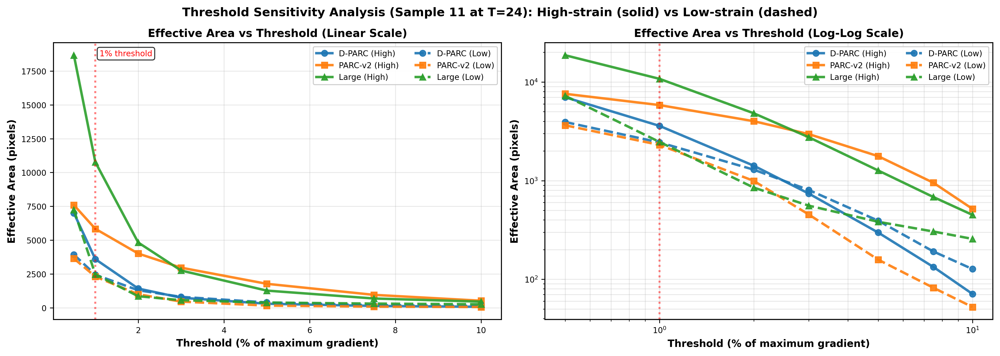


SUMMARY (Sample 11): AVERAGED METRICS AT 1% THRESHOLD

Region                             D-PARC                   PARC-v2                     Large
                   Area (px)     Sparsity    Area (px)     Sparsity    Area (px)     Sparsity
----------------------------------------------------------------------------------------------------
High strain            3592   89.04%         5838   82.18%        10772   67.13%
Low strain             2443   92.54%         2303   92.97%         2469   92.47%

✅ NOTE: Higher sparsity = more selective (fewer pixels activated)

GENERATING VISUALIZATION FOR REPRESENTATIVE POINTS

✓ Saved to: erf_multipoint_analysis_navierstokes/sample11_representative_erf_T24.png


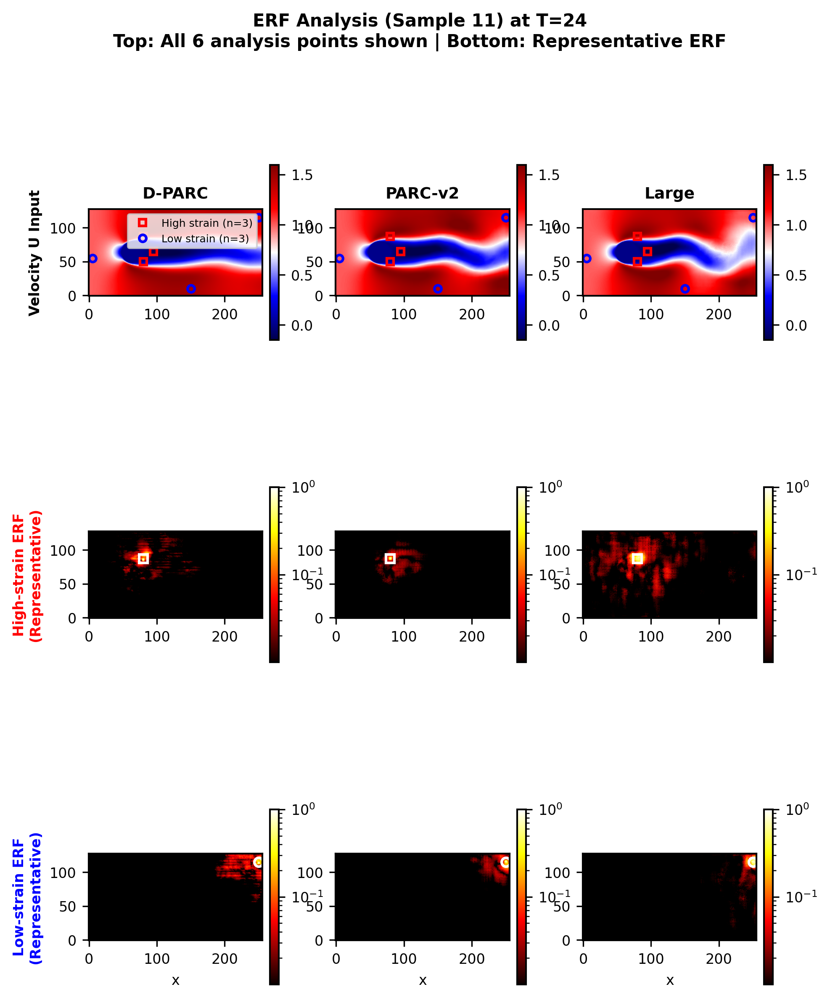


✓ MULTI-POINT ERF ANALYSIS COMPLETE! (NAVIER-STOKES)

📊 Key Findings for Sample 11 (Higher sparsity = more selective):

High-strain Regions (averaged over 3 points):
  D-PARC:   3592 ± 319 px (sparsity: 89.04%)
  PARC-v2:  5838 ± 2373 px (sparsity: 82.18%)
  Large:    10772 ± 4030 px (sparsity: 67.13%)

Low-strain Regions (averaged over 3 points):
  D-PARC:   2443 ± 712 px (sparsity: 92.54%)
  PARC-v2:  2303 ± 335 px (sparsity: 92.97%)
  Large:    2469 ± 930 px (sparsity: 92.47%)

📁 Outputs:
  - High-strain metrics: erf_multipoint_analysis_navierstokes/sample11_erf_avg_high_strain_T24.csv
  - Low-strain metrics: erf_multipoint_analysis_navierstokes/sample11_erf_avg_low_strain_T24.csv
  - Combined threshold plots: erf_multipoint_analysis_navierstokes/sample11_threshold_sensitivity_combined_T24.png
  - Representative ERF: erf_multipoint_analysis_navierstokes/sample11_representative_erf_T24.png

💡 TIPS FOR NAVIER-STOKES:
  - Adjust HIGH_strain_POINTS and LOW_strain_POINTS based on your d

In [7]:
################################################################################
# CELL: Multi-Point ERF Analysis - High vs Low strain Regions (Navier-Stokes)
# (Corrected for Specific Sample Selection)
################################################################################
"""
Multi-Point ERF Analysis for Navier-Stokes Equation

Analyzes ERF at 6 points (3 high-strain, 3 low-strain) at a specified timestep:
- Computes effective area and sparsity at multiple thresholds
- Averages metrics across high-strain and low-strain regions
- Generates visualizations for representative points
- Generates threshold sensitivity plots (linear + log)
- Exports metrics to CSV and prints to screen

Adapted from Burgers analysis code for incompressible Navier-Stokes.
Uses strain (curl of velocity field) as the distinguishing feature.
"""

import gc
import warnings
import os
from pathlib import Path
warnings.filterwarnings('ignore', category=UserWarning, module='matplotlib.font_manager')
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import torch
import json
import csv

print("\n" + "="*80)
print("MULTI-POINT ERF ANALYSIS - HIGH VS LOW strain (NAVIER-STOKES)")
print("="*80)

# =============================================================================
# Configuration
# =============================================================================

# --- KEY CHANGE: Set the specific sample you want to analyze ---
SAMPLE_ID_TO_ANALYZE = 11  # e.g., 0, 8, 12 (must be less than total samples)

ANALYZE_TIMESTEP = 24  # Which timestep to analyze (adjust as needed)
CHANNEL_TO_VISUALIZE = 2  # 0=Reynolds, 1=Pressure, 2=U, 3=V (U velocity for visualization)
VMIN_VIZ = None  # Auto-scale (or set explicitly)
VMAX_VIZ = None  # Auto-scale (or set explicitly)

# Define analysis points
# For Navier-Stokes: High-strain regions have strong velocity curl
# You should adjust these points based on your data!
HIGH_strain_POINTS = [
    (87, 80),    # Point 1 - High strain
    (65, 95),    # Point 2 - High strain
    (50, 80),    # Point 3 - High strain
]

LOW_strain_POINTS = [
    (115, 250),   # Point 1 - Low strain
    (10, 150),   # Point 2 - Low strain
    (55, 5),     # Point 3 - Low strain
]

# Thresholds to test
TEST_THRESHOLDS = [0.005, 0.01, 0.02, 0.03, 0.05, 0.075, 0.10]

# Output configuration
OUTPUT_DIR = Path("erf_multipoint_analysis_navierstokes")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print(f"\n✓ Configuration:")
print(f"  Analyzing Sample ID: {SAMPLE_ID_TO_ANALYZE}")
print(f"  Timestep: T={ANALYZE_TIMESTEP}")
print(f"  High-strain points: {len(HIGH_strain_POINTS)}")
print(f"  Low-strain points: {len(LOW_strain_POINTS)}")
print(f"  Visualizing channel: {['Reynolds', 'Pressure', 'Velocity U', 'Velocity V'][CHANNEL_TO_VISUALIZE]}")
print(f"  Output directory: {OUTPUT_DIR.resolve()}")

# =============================================================================
# Helper Functions
# =============================================================================

def set_plot_style():
    """Publication-ready style."""
    plt.rcParams.update({
        'font.family': 'DejaVu Sans',
        'font.size': 8,
        'axes.labelsize': 8,
        'axes.titlesize': 9,
        'legend.fontsize': 7,
        'figure.dpi': 300,
        'axes.linewidth': 1.0,
    })

def denormalize_channel(normalized_data, channel_idx, norm_params):
    """Denormalize a single channel back to physical units."""
    channel_min = norm_params["channel_min"][channel_idx]
    channel_max = norm_params["channel_max"][channel_idx]
    return normalized_data * (channel_max - channel_min) + channel_min

def compute_unet_erf_aggregate(model, input_state, output_point):
    """Compute UNet-only ERF aggregated across all output features."""
    # Find UNet in model structure
    unet = None
    possible_names = ['feature_extraction', 'feature_extractor', 'unet', 'network', 
                      'fe_network', 'encoder', 'feature_net']
    
    for attr_name in possible_names:
        if hasattr(model.differentiator, attr_name):
            unet = getattr(model.differentiator, attr_name)
            break
    
    if unet is None:
        raise AttributeError("Could not find UNet in model.differentiator")
    
    unet.eval()
    input_grad = input_state.detach().requires_grad_(True)
    
    with torch.set_grad_enabled(True):
        features = unet(input_grad)
        output_value = features[0, :, output_point[0], output_point[1]].sum()
    
    if input_grad.grad is not None:
        input_grad.grad.zero_()
    output_value.backward()
    
    if input_grad.grad is None:
        raise RuntimeError("Gradients are None!")
    
    gradients = input_grad.grad[0].detach().cpu().numpy()
    erf_map = np.abs(gradients)
    
    del input_grad, features, output_value
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    gc.collect()
    
    return erf_map

# =============================================================================
# Core ERF Computation for Multiple Points
# =============================================================================

def compute_erf_metrics_for_point(erf_map, thresholds):
    """
    Compute streamlined ERF metrics for a single point.
    """
    erf_agg = np.sum(erf_map, axis=0)
    erf_norm = erf_agg / (erf_agg.max() + 1e-10)
    
    total_pixels = erf_norm.size
    
    results = {}
    for thresh in thresholds:
        erf_binary = (erf_norm > thresh).astype(float)
        activated = np.sum(erf_binary)
        
        # Sparsity = percentage NOT activated
        sparsity = (1 - activated / total_pixels) * 100
        
        results[thresh] = {
            'area': activated,
            'sparsity': sparsity
        }
    
    return results

def analyze_multiple_points(model, input_state, points, thresholds, point_type):
    """
    Analyze ERF at multiple points and return metrics.
    """
    print(f"\n  Analyzing {len(points)} {point_type} points...")
    
    results = {}
    
    for idx, point in enumerate(points):
        print(f"    Point {idx+1}/{len(points)}: {point}")
        
        # Compute ERF
        erf_map = compute_unet_erf_aggregate(model, input_state.clone(), point)
        
        # Compute metrics
        metrics = compute_erf_metrics_for_point(erf_map, thresholds)
        
        results[f'point_{idx+1}'] = {
            'coords': point,
            'erf_map': erf_map,
            'metrics': metrics
        }
    
    # Compute averages across all points
    avg_metrics = {}
    for thresh in thresholds:
        areas = [results[f'point_{i+1}']['metrics'][thresh]['area'] 
                 for i in range(len(points))]
        sparsities = [results[f'point_{i+1}']['metrics'][thresh]['sparsity'] 
                      for i in range(len(points))]
        
        avg_metrics[thresh] = {
            'area_mean': np.mean(areas),
            'area_std': np.std(areas),
            'sparsity_mean': np.mean(sparsities),
            'sparsity_std': np.std(sparsities)
        }
    
    results['average'] = avg_metrics
    
    return results

# =============================================================================
# Get State at Target Timestep (from earlier cell)
# =============================================================================

def get_state_and_output(model, ic, t0, t1, target_timestep):
    """
    Run model forward to get state at timestep T and output at T+1.
    """
    model.eval()
    with torch.no_grad():
        if target_timestep == 0:
            # State is IC, output is first prediction
            state_at_t = ic.clone()
            t1_single = t1[:1]
            rollout = model(ic, t0, t1_single)
            output_at_t1 = rollout[0, :, :, :, :].clone()
        else:
            # Run forward to get both T and T+1
            t1_partial = t1[:target_timestep+2]
            rollout = model(ic, t0, t1_partial)
            state_at_t = rollout[target_timestep, :, :, :, :].clone()
            output_at_t1 = rollout[target_timestep+1, :, :, :, :].clone()
    
    return state_at_t, output_at_t1

print("\n" + "="*80)
print("LOADING DATA AND EXTRACTING STATES")
print("="*80)

# Load data for ERF analysis
print(f"\nLoading data for ERF analysis...")
ERF_FORWARD_STEPS = ANALYZE_TIMESTEP + 2  # Need T and T+1

erf_dataset = GenericPhysicsDataset(
    data_dirs=[EVAL_DATA_DIR],
    future_steps=ERF_FORWARD_STEPS,
    min_max_path=MIN_MAX_PATH
)

# --- KEY CHANGE: Load specific sample, not just the first one ---
erf_loader = DataLoader(
    erf_dataset,  
    batch_size=1,  # Still needed for collate_fn logic
    shuffle=False,
    num_workers=1,  
    pin_memory=(DEVICE=='cuda'),
    collate_fn=custom_collate_fn
)

print(f"\nLoading SPECIFIC sample {SAMPLE_ID_TO_ANALYZE} for ERF analysis...")
if SAMPLE_ID_TO_ANALYZE >= len(erf_dataset):
    print(f"⚠️ SAMPLE_ID_TO_ANALYZE ({SAMPLE_ID_TO_ANALYZE}) is out of dataset range! Defaulting to 0.")
    SAMPLE_ID_TO_ANALYZE = 0

# Get the specific sample AND create a batch of size 1
sample_data = erf_dataset[SAMPLE_ID_TO_ANALYZE]
erf_batch = custom_collate_fn([sample_data]) # Use collate_fn to build a batch of size 1

erf_ic, erf_t0, erf_t1, _ = erf_batch
erf_ic = erf_ic.to(DEVICE)
erf_t0 = erf_t0.to(DEVICE)
erf_t1 = erf_t1.to(DEVICE)

print(f"✓ ERF data loaded for sample {SAMPLE_ID_TO_ANALYZE}. IC shape: {erf_ic.shape}")
# --- END KEY CHANGE ---


# Load normalization parameters
with open(MIN_MAX_PATH, 'r') as f:
    norm_params = json.load(f)

print(f"\nExtracting states at T={ANALYZE_TIMESTEP}...")

state_at_t_deform, output_at_t1_deform = get_state_and_output(
    model_deform, erf_ic, erf_t0, erf_t1, ANALYZE_TIMESTEP
)
state_at_t_standard, output_at_t1_standard = get_state_and_output(
    model_standard, erf_ic, erf_t0, erf_t1, ANALYZE_TIMESTEP
)
state_at_t_large, output_at_t1_large = get_state_and_output(
    model_large, erf_ic, erf_t0, erf_t1, ANALYZE_TIMESTEP
)

print(f"✓ States at T={ANALYZE_TIMESTEP} extracted. Shape: {state_at_t_deform.shape}")

# =============================================================================
# Analyze All Models and Points
# =============================================================================

print("\n" + "="*80)
print("COMPUTING ERF FOR ALL POINTS AND MODELS")
print("="*80)

# Storage for results
all_results = {
    'D-PARC': {'high_strain': None, 'low_strain': None},
    'PARC-v2': {'high_strain': None, 'low_strain': None},
    'Large': {'high_strain': None, 'low_strain': None}
}

# D-PARC
print("\n[1/3] D-PARC")
all_results['D-PARC']['high_strain'] = analyze_multiple_points(
    model_deform, state_at_t_deform, HIGH_strain_POINTS, TEST_THRESHOLDS, 'high_strain'
)
all_results['D-PARC']['low_strain'] = analyze_multiple_points(
    model_deform, state_at_t_deform, LOW_strain_POINTS, TEST_THRESHOLDS, 'low_strain'
)

# PARC-v2
print("\n[2/3] PARC-v2")
all_results['PARC-v2']['high_strain'] = analyze_multiple_points(
    model_standard, state_at_t_standard, HIGH_strain_POINTS, TEST_THRESHOLDS, 'high_strain'
)
all_results['PARC-v2']['low_strain'] = analyze_multiple_points(
    model_standard, state_at_t_standard, LOW_strain_POINTS, TEST_THRESHOLDS, 'low_strain'
)

# Large
print("\n[3/3] Large")
all_results['Large']['high_strain'] = analyze_multiple_points(
    model_large, state_at_t_large, HIGH_strain_POINTS, TEST_THRESHOLDS, 'high_strain'
)
all_results['Large']['low_strain'] = analyze_multiple_points(
    model_large, state_at_t_large, LOW_strain_POINTS, TEST_THRESHOLDS, 'low_strain'
)

print("\n✓ ERF computation complete for all points!")

# =============================================================================
# Export Averaged Metrics to CSV and Print to Screen
# =============================================================================

print("\n" + "="*80)
print("EXPORTING AVERAGED METRICS")
print("="*80)

# --- KEY CHANGE: Updated filename ---
csv_high = OUTPUT_DIR / f'sample{SAMPLE_ID_TO_ANALYZE}_erf_avg_high_strain_T{ANALYZE_TIMESTEP}.csv'
print(f"\n📊 HIGH-strain REGION (averaged over {len(HIGH_strain_POINTS)} points)")
print(f"{'Threshold':<12} {'D-PARC':>30} {'PARC-v2':>30} {'Large':>30}")
print(f"{'(% of max)':<12} {'Area (mean±std)':>15} {'Sparsity':>15} {'Area (mean±std)':>15} {'Sparsity':>15} {'Area (mean±std)':>15} {'Sparsity':>15}")
print("-" * 115)

with open(csv_high, 'w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(['Threshold (%)', 
                     'D-PARC Area (mean±std)', 'D-PARC Sparsity (mean±std)',
                     'PARC-v2 Area (mean±std)', 'PARC-v2 Sparsity (mean±std)',
                     'Large Area (mean±std)', 'Large Sparsity (mean±std)'])
    
    for thresh in TEST_THRESHOLDS:
        row = [f"{thresh*100:.1f}"]
        print_data = [f"{thresh*100:>6.1f}%      "]
        for model in ['D-PARC', 'PARC-v2', 'Large']:
            avg = all_results[model]['high_strain']['average'][thresh]
            row.append(f"{avg['area_mean']:.1f}±{avg['area_std']:.1f}")
            row.append(f"{avg['sparsity_mean']:.2f}±{avg['sparsity_std']:.2f}")
            print_data.append(f"{avg['area_mean']:>7.0f}±{avg['area_std']:<6.0f}")
            print_data.append(f"{avg['sparsity_mean']:>6.2f}±{avg['sparsity_std']:<6.2f}")
        writer.writerow(row)
        print(''.join(print_data))

print(f"\n✓ Saved to: {csv_high}")

# --- KEY CHANGE: Updated filename ---
csv_low = OUTPUT_DIR / f'sample{SAMPLE_ID_TO_ANALYZE}_erf_avg_low_strain_T{ANALYZE_TIMESTEP}.csv'
print(f"\n📊 LOW-strain REGION (averaged over {len(LOW_strain_POINTS)} points)")
print(f"{'Threshold':<12} {'D-PARC':>30} {'PARC-v2':>30} {'Large':>30}")
print(f"{'(% of max)':<12} {'Area (mean±std)':>15} {'Sparsity':>15} {'Area (mean±std)':>15} {'Sparsity':>15} {'Area (mean±std)':>15} {'Sparsity':>15}")
print("-" * 115)

with open(csv_low, 'w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(['Threshold (%)', 
                     'D-PARC Area (mean±std)', 'D-PARC Sparsity (mean±std)',
                     'PARC-v2 Area (mean±std)', 'PARC-v2 Sparsity (mean±std)',
                     'Large Area (mean±std)', 'Large Sparsity (mean±std)'])
    
    for thresh in TEST_THRESHOLDS:
        row = [f"{thresh*100:.1f}"]
        print_data = [f"{thresh*100:>6.1f}%      "]
        for model in ['D-PARC', 'PARC-v2', 'Large']:
            avg = all_results[model]['low_strain']['average'][thresh]
            row.append(f"{avg['area_mean']:.1f}±{avg['area_std']:.1f}")
            row.append(f"{avg['sparsity_mean']:.2f}±{avg['sparsity_std']:.2f}")
            print_data.append(f"{avg['area_mean']:>7.0f}±{avg['area_std']:<6.0f}")
            print_data.append(f"{avg['sparsity_mean']:>6.2f}±{avg['sparsity_std']:<6.2f}")
        writer.writerow(row)
        print(''.join(print_data))

print(f"\n✓ Saved to: {csv_low}")

# =============================================================================
# Threshold Sensitivity Plots (Combined High/Low strain)
# =============================================================================

print("\n" + "="*80)
print("GENERATING THRESHOLD SENSITIVITY PLOTS")
print("="*80)

# --- KEY CHANGE: Added 'sample_id' parameter ---
def plot_threshold_sensitivity_combined(all_results, thresholds, output_dir, sample_id, timestep):
    """
    Plot threshold sensitivity with high-strain and low-strain on same plots.
    """
    set_plot_style()
    
    high_areas = {
        'D-PARC': [all_results['D-PARC']['high_strain']['average'][t]['area_mean'] for t in thresholds],
        'PARC-v2': [all_results['PARC-v2']['high_strain']['average'][t]['area_mean'] for t in thresholds],
        'Large': [all_results['Large']['high_strain']['average'][t]['area_mean'] for t in thresholds]
    }
    low_areas = {
        'D-PARC': [all_results['D-PARC']['low_strain']['average'][t]['area_mean'] for t in thresholds],
        'PARC-v2': [all_results['PARC-v2']['low_strain']['average'][t]['area_mean'] for t in thresholds],
        'Large': [all_results['Large']['low_strain']['average'][t]['area_mean'] for t in thresholds]
    }
    
    thresh_percent = np.array(thresholds) * 100
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    model_styles = {
        'D-PARC': {'color': 'C0', 'marker': 'o'},
        'PARC-v2': {'color': 'C1', 'marker': 's'},
        'Large': {'color': 'C2', 'marker': '^'}
    }
    
    line_props_solid = {'linewidth': 2.5, 'markersize': 6, 'alpha': 0.9, 'linestyle': '-'}
    line_props_dashed = {'linewidth': 2.5, 'markersize': 6, 'alpha': 0.9, 'linestyle': '--'}
    
    # ========== LINEAR SCALE ==========
    ax = axes[0]
    for model in ['D-PARC', 'PARC-v2', 'Large']:
        ax.plot(thresh_percent, high_areas[model], 
                label=f'{model} (High)', 
                color=model_styles[model]['color'],
                marker=model_styles[model]['marker'],
                **line_props_solid)
    for model in ['D-PARC', 'PARC-v2', 'Large']:
        ax.plot(thresh_percent, low_areas[model], 
                label=f'{model} (Low)', 
                color=model_styles[model]['color'],
                marker=model_styles[model]['marker'],
                **line_props_dashed)
    
    ax.axvline(1.0, color='red', linestyle=':', alpha=0.5, linewidth=2)
    ax.text(1.1, ax.get_ylim()[1]*0.95, '1% threshold', 
            fontsize=8, color='red', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax.set_xlabel('Threshold (% of maximum gradient)', fontweight='bold', fontsize=10)
    ax.set_ylabel('Effective Area (pixels)', fontweight='bold', fontsize=10)
    ax.set_title('Effective Area vs Threshold (Linear Scale)', fontweight='bold', fontsize=11)
    ax.legend(framealpha=0.95, fontsize=8, ncol=2, loc='best')
    ax.grid(True, alpha=0.3)
    
    # ========== LOG-LOG SCALE ==========
    ax = axes[1]
    for model in ['D-PARC', 'PARC-v2', 'Large']:
        ax.loglog(thresh_percent, high_areas[model], 
                  label=f'{model} (High)', 
                  color=model_styles[model]['color'],
                  marker=model_styles[model]['marker'],
                  **line_props_solid)
    for model in ['D-PARC', 'PARC-v2', 'Large']:
        ax.loglog(thresh_percent, low_areas[model], 
                  label=f'{model} (Low)', 
                  color=model_styles[model]['color'],
                  marker=model_styles[model]['marker'],
                  **line_props_dashed)
    
    ax.axvline(1.0, color='red', linestyle=':', alpha=0.5, linewidth=2)
    
    ax.set_xlabel('Threshold (% of maximum gradient)', fontweight='bold', fontsize=10)
    ax.set_ylabel('Effective Area (pixels)', fontweight='bold', fontsize=10)
    ax.set_title('Effective Area vs Threshold (Log-Log Scale)', fontweight='bold', fontsize=11)
    ax.legend(framealpha=0.95, fontsize=8, ncol=2, loc='best')
    ax.grid(True, alpha=0.3, which='both')
    
    # --- KEY CHANGE: Updated suptitle ---
    plt.suptitle(f'Threshold Sensitivity Analysis (Sample {sample_id} at T={timestep}): High-strain (solid) vs Low-strain (dashed)',
                 fontsize=12, fontweight='bold')
    plt.tight_layout()
    
    # --- KEY CHANGE: Updated filename ---
    output_path = output_dir / f'sample{sample_id}_threshold_sensitivity_combined_T{timestep}.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"\n✓ Saved to: {output_path}")
    plt.show()
    plt.close()
    gc.collect()

# Generate plots
# --- KEY CHANGE: Pass sample_id and timestep ---
plot_threshold_sensitivity_combined(all_results, TEST_THRESHOLDS, OUTPUT_DIR, SAMPLE_ID_TO_ANALYZE, ANALYZE_TIMESTEP)

# =============================================================================
# Print Summary Table
# =============================================================================

print("\n" + "="*80)
# --- KEY CHANGE: Updated title ---
print(f"SUMMARY (Sample {SAMPLE_ID_TO_ANALYZE}): AVERAGED METRICS AT 1% THRESHOLD")
print("="*80)

print(f"\n{'Region':<15} {'D-PARC':>25} {'PARC-v2':>25} {'Large':>25}")
print(f"{'':^15} {'Area (px)':>12} {'Sparsity':>12} {'Area (px)':>12} {'Sparsity':>12} {'Area (px)':>12} {'Sparsity':>12}")
print("-" * 100)

thresh_1pct = 0.01

# High strain
high_d = all_results['D-PARC']['high_strain']['average'][thresh_1pct]
high_s = all_results['PARC-v2']['high_strain']['average'][thresh_1pct]
high_l = all_results['Large']['high_strain']['average'][thresh_1pct]

print(f"{'High strain':<15} "
      f"{high_d['area_mean']:>11.0f}  {high_d['sparsity_mean']:>6.2f}%  "
      f"{high_s['area_mean']:>11.0f}  {high_s['sparsity_mean']:>6.2f}%  "
      f"{high_l['area_mean']:>11.0f}  {high_l['sparsity_mean']:>6.2f}%")

# Low strain
low_d = all_results['D-PARC']['low_strain']['average'][thresh_1pct]
low_s = all_results['PARC-v2']['low_strain']['average'][thresh_1pct]
low_l = all_results['Large']['low_strain']['average'][thresh_1pct]

print(f"{'Low strain':<15} "
      f"{low_d['area_mean']:>11.0f}  {low_d['sparsity_mean']:>6.2f}%  "
      f"{low_s['area_mean']:>11.0f}  {low_s['sparsity_mean']:>6.2f}%  "
      f"{low_l['area_mean']:>11.0f}  {low_l['sparsity_mean']:>6.2f}%")

print("\n✅ NOTE: Higher sparsity = more selective (fewer pixels activated)")

# =============================================================================
# Visualization: Representative Point from Each Region (ALL 6 POINTS SHOWN)
# =============================================================================

print("\n" + "="*80)
print("GENERATING VISUALIZATION FOR REPRESENTATIVE POINTS")
print("="*80)

# --- KEY CHANGE: Added 'sample_id' parameter ---
def plot_representative_erf_all_points(
    state_d, state_s, state_l,
    erf_high_d, erf_high_s, erf_high_l, point_high,
    erf_low_d, erf_low_s, erf_low_l, point_low,
    all_high_points, all_low_points,
    norm_params, sample_id, timestep, channel_idx, vmin, vmax, output_path
):
    """
    Plot ERF for one representative high-strain and one low-strain point.
    Shows ALL 6 analysis points on the velocity/pressure input row.
    """
    set_plot_style()
    
    # Channel names and colormaps
    channel_names = ['Reynolds Number', 'Pressure', 'Velocity U', 'Velocity V']
    channel_cmaps = ['viridis', 'plasma', 'seismic', 'seismic']
    
    # Denormalize field
    state_d_np = denormalize_channel(state_d[0, channel_idx].cpu().numpy(), channel_idx, norm_params)
    state_s_np = denormalize_channel(state_s[0, channel_idx].cpu().numpy(), channel_idx, norm_params)
    state_l_np = denormalize_channel(state_l[0, channel_idx].cpu().numpy(), channel_idx, norm_params)
    
    # Auto-scale if needed
    if vmin is None or vmax is None:
        all_data = np.concatenate([state_d_np.flatten(), state_s_np.flatten(), state_l_np.flatten()])
        vmin = np.percentile(all_data, 1)
        vmax = np.percentile(all_data, 99)
    
    # Process ERFs for representative points
    def process_erf(erf_map):
        erf_agg = np.sum(erf_map, axis=0)
        erf_norm = erf_agg / (erf_agg.max() + 1e-10)
        threshold = 0.01
        erf_masked = np.where(erf_norm > threshold, erf_norm, np.nan)
        return erf_masked
    
    erf_high_d_masked = process_erf(erf_high_d)
    erf_high_s_masked = process_erf(erf_high_s)
    erf_high_l_masked = process_erf(erf_high_l)
    
    erf_low_d_masked = process_erf(erf_low_d)
    erf_low_s_masked = process_erf(erf_low_s)
    erf_low_l_masked = process_erf(erf_low_l)
    
    # Compute shared vmin for log scale
    def safe_nanmin(arr, default=1e-3):
        valid = arr[~np.isnan(arr)]
        return valid.min() if len(valid) > 0 else default
    
    vmin_shared = min([
        safe_nanmin(erf_high_d_masked), safe_nanmin(erf_high_s_masked), safe_nanmin(erf_high_l_masked),
        safe_nanmin(erf_low_d_masked), safe_nanmin(erf_low_s_masked), safe_nanmin(erf_low_l_masked)
    ])
    
    # Create figure
    fig = plt.figure(figsize=(7, 9))
    gs = gridspec.GridSpec(3, 3, figure=fig, hspace=0.4, wspace=0.3)
    
    # Marker styles
    high_marker_props = {'marker': 's', 'markersize': 4, 'markerfacecolor': 'none', 
                         'markeredgecolor': 'red', 'markeredgewidth': 1.5, 'linestyle': 'none'}
    low_marker_props = {'marker': 'o', 'markersize': 4, 'markerfacecolor': 'none', 
                        'markeredgecolor': 'blue', 'markeredgewidth': 1.5, 'linestyle': 'none'}
    
    # Row 0: Field input with ALL 6 points shown
    for col, (field_data, title) in enumerate([
        (state_d_np, 'D-PARC'),
        (state_s_np, 'PARC-v2'),
        (state_l_np, 'Large')
    ]):
        ax = fig.add_subplot(gs[0, col])
        im = ax.imshow(field_data, cmap=channel_cmaps[channel_idx], origin='lower', vmin=vmin, vmax=vmax)
        
        for pt in all_high_points:
            ax.plot(pt[1], pt[0], **high_marker_props)
        for pt in all_low_points:
            ax.plot(pt[1], pt[0], **low_marker_props)
        
        ax.set_title(title, fontweight='bold')
        
        if col == 0:
            ax.set_ylabel(f'{channel_names[channel_idx]} Input', fontweight='bold')
            from matplotlib.lines import Line2D
            legend_elements = [
                Line2D([0], [0], **high_marker_props, label=f'High strain (n={len(all_high_points)})'),
                Line2D([0], [0], **low_marker_props, label=f'Low strain (n={len(all_low_points)})')
            ]
            ax.legend(handles=legend_elements, fontsize=6, loc='upper right')
        
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    
    # Row 1: High-strain ERF (representative point only)
    for col, (erf_data, title) in enumerate([
        (erf_high_d_masked, 'D-PARC'),
        (erf_high_s_masked, 'PARC-v2'),
        (erf_high_l_masked, 'Large')
    ]):
        ax = fig.add_subplot(gs[1, col])
        ax.set_facecolor('black')
        im = ax.imshow(erf_data, cmap='hot', origin='lower',
                       norm=LogNorm(vmin=vmin_shared, vmax=1.0))
        ax.plot(point_high[1], point_high[0], 's', markersize=5,
                markerfacecolor='none', markeredgecolor='white', markeredgewidth=1.5)
        if col == 0:
            ax.set_ylabel('High-strain ERF\n(Representative)', fontweight='bold', color='red')
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    
    # Row 2: Low-strain ERF (representative point only)
    for col, (erf_data, title) in enumerate([
        (erf_low_d_masked, 'D-PARC'),
        (erf_low_s_masked, 'PARC-v2'),
        (erf_low_l_masked, 'Large')
    ]):
        ax = fig.add_subplot(gs[2, col])
        ax.set_facecolor('black')
        im = ax.imshow(erf_data, cmap='hot', origin='lower',
                       norm=LogNorm(vmin=vmin_shared, vmax=1.0))
        ax.plot(point_low[1], point_low[0], 'o', markersize=5,
                markerfacecolor='none', markeredgecolor='white', markeredgewidth=1.5)
        ax.set_xlabel('x')
        if col == 0:
            ax.set_ylabel('Low-strain ERF\n(Representative)', fontweight='bold', color='blue')
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    
    # --- KEY CHANGE: Updated suptitle ---
    plt.suptitle(f'ERF Analysis (Sample {sample_id}) at T={timestep}\n'
                 f'Top: All {len(all_high_points)+len(all_low_points)} analysis points shown | Bottom: Representative ERF',
                 fontsize=10, fontweight='bold', y=0.99)
    
    plt.savefig(output_path, bbox_inches='tight', dpi=300)
    print(f"\n✓ Saved to: {output_path}")
    plt.show()
    plt.close()
    gc.collect()

# --- KEY CHANGE: Updated filename and passed sample_id ---
png_erf_path = OUTPUT_DIR / f'sample{SAMPLE_ID_TO_ANALYZE}_representative_erf_T{ANALYZE_TIMESTEP}.png'

# Generate visualization using first point from each region
plot_representative_erf_all_points(
    state_at_t_deform, state_at_t_standard, state_at_t_large,
    all_results['D-PARC']['high_strain']['point_1']['erf_map'],
    all_results['PARC-v2']['high_strain']['point_1']['erf_map'],
    all_results['Large']['high_strain']['point_1']['erf_map'],
    HIGH_strain_POINTS[0],
    all_results['D-PARC']['low_strain']['point_1']['erf_map'],
    all_results['PARC-v2']['low_strain']['point_1']['erf_map'],
    all_results['Large']['low_strain']['point_1']['erf_map'],
    LOW_strain_POINTS[0],
    HIGH_strain_POINTS,  # Pass all high-strain points
    LOW_strain_POINTS,   # Pass all low-strain points
    norm_params, SAMPLE_ID_TO_ANALYZE, ANALYZE_TIMESTEP, CHANNEL_TO_VISUALIZE, VMIN_VIZ, VMAX_VIZ,
    png_erf_path
)

# =============================================================================
# Summary
# =============================================================================

print("\n" + "="*80)
print("✓ MULTI-POINT ERF ANALYSIS COMPLETE! (NAVIER-STOKES)")
print("="*80)

# --- KEY CHANGE: Updated title ---
print(f"\n📊 Key Findings for Sample {SAMPLE_ID_TO_ANALYZE} (Higher sparsity = more selective):")
print(f"\nHigh-strain Regions (averaged over {len(HIGH_strain_POINTS)} points):")
print(f"  D-PARC:   {high_d['area_mean']:.0f} ± {high_d['area_std']:.0f} px (sparsity: {high_d['sparsity_mean']:.2f}%)")
print(f"  PARC-v2:  {high_s['area_mean']:.0f} ± {high_s['area_std']:.0f} px (sparsity: {high_s['sparsity_mean']:.2f}%)")
print(f"  Large:    {high_l['area_mean']:.0f} ± {high_l['area_std']:.0f} px (sparsity: {high_l['sparsity_mean']:.2f}%)")

print(f"\nLow-strain Regions (averaged over {len(LOW_strain_POINTS)} points):")
print(f"  D-PARC:   {low_d['area_mean']:.0f} ± {low_d['area_std']:.0f} px (sparsity: {low_d['sparsity_mean']:.2f}%)")
print(f"  PARC-v2:  {low_s['area_mean']:.0f} ± {low_s['area_std']:.0f} px (sparsity: {low_s['sparsity_mean']:.2f}%)")
print(f"  Large:    {low_l['area_mean']:.0f} ± {low_l['area_std']:.0f} px (sparsity: {low_l['sparsity_mean']:.2f}%)")

# --- KEY CHANGE: Updated print paths ---
png_sensitivity_path = OUTPUT_DIR / f'sample{SAMPLE_ID_TO_ANALYZE}_threshold_sensitivity_combined_T{ANALYZE_TIMESTEP}.png'
print("\n📁 Outputs:")
print(f"  - High-strain metrics: {csv_high}")
print(f"  - Low-strain metrics: {csv_low}")
print(f"  - Combined threshold plots: {png_sensitivity_path}")
print(f"  - Representative ERF: {png_erf_path}") # This path is now correct

print("\n💡 TIPS FOR NAVIER-STOKES:")
print("  - Adjust HIGH_strain_POINTS and LOW_strain_POINTS based on your data")
print("  - High-strain = regions with strong velocity curl (turbulent flow)")
print("  - Low-strain = regions with smooth, irrotational flow")
print("  - You may want to compute actual strain (∂v/∂x - ∂u/∂y) to identify points")
print("  - For 2D incompressible flow, strain reveals coherent structures")
print("  - Try different timesteps and samples to see how ERF evolves")

print("\n" + "="*80)

In [17]:
################################################################################
# CELL: Multi-Point ERF Analysis - Relative Spatial Sparsity (Navier-Stokes)
# (Corrected Calculation Logic per Burgers V4.3)
################################################################################
"""
Multi-Point ERF Analysis for Navier-Stokes Equation

Features:
- Relative Sparsity = (1 - Area / Denominator) * 100%
- PARCv2 Denominator = min(TRF, HxW) (Restricted by Theoretical Receptive Field)
- D-PARC Denominator = HxW (Global)
- Uses Manual Navier-Stokes Points
"""

import gc
import warnings
import os
from pathlib import Path
warnings.filterwarnings('ignore', category=UserWarning, module='matplotlib.font_manager')
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import torch
import json
import csv

print("\n" + "="*80)
print("MULTI-POINT ERF ANALYSIS - RELATIVE SPATIAL SPARSITY (NAVIER-STOKES)")
print("="*80)

# =============================================================================
# Configuration
# =============================================================================

SAMPLE_ID_TO_ANALYZE = 11
ANALYZE_TIMESTEP = 24
CHANNEL_TO_VISUALIZE = 2  # 2 = Velocity U
VMIN_VIZ = None
VMAX_VIZ = None

# Manual Navier-Stokes Points
HIGH_STRAIN_POINTS = [
    (87, 80),    # Point 1 - High strain
    (45, 80),    # Point 2 - High strain
    (50, 80),    # Point 3 - High strain
]

LOW_STRAIN_POINTS = [
    (105, 202),   # Point 1 - Low strain
    (10, 150),   # Point 2 - Low strain
    (55, 5),      # Point 3 - Low strain
]

TEST_THRESHOLDS = [0.005, 0.01, 0.02, 0.03, 0.05, 0.075, 0.10]

OUTPUT_DIR = Path("erf_multipoint_analysis_navierstokes")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# --- DENOMINATOR CONFIGURATION ---
# Adjust this if your NS model is deeper than your Burgers model.
# If unknown, you can set this to H*W to disable the TRF cap.
PARCV2_TRF_AREA = 6084  # Theoretical Receptive Field Area (e.g. 18x18)

print(f"\n✓ Configuration:")
print(f"  Sample ID: {SAMPLE_ID_TO_ANALYZE}")
print(f"  Timestep: T={ANALYZE_TIMESTEP}")
print(f"  PARCv2 TRF Area: {PARCV2_TRF_AREA} pixels")

# =============================================================================
# Helper Functions
# =============================================================================

def set_plot_style():
    plt.rcParams.update({
        'font.family': 'DejaVu Sans', 'font.size': 8, 'axes.labelsize': 8,
        'axes.titlesize': 9, 'legend.fontsize': 7, 'figure.dpi': 300,
        'axes.linewidth': 1.0,
    })

def denormalize_channel(normalized_data, channel_idx, norm_params):
    channel_min = norm_params["channel_min"][channel_idx]
    channel_max = norm_params["channel_max"][channel_idx]
    return normalized_data * (channel_max - channel_min) + channel_min

def compute_unet_erf_aggregate(model, input_state, output_point):
    """Compute UNet-only ERF aggregated across all output features."""
    unet = None
    possible_names = ['feature_extraction', 'feature_extractor', 'unet', 'network']
    
    for attr_name in possible_names:
        if hasattr(model.differentiator, attr_name):
            unet = getattr(model.differentiator, attr_name)
            break
    
    if unet is None: raise AttributeError("Could not find UNet in model.differentiator")
    
    unet.eval()
    input_grad = input_state.detach().requires_grad_(True)
    
    with torch.set_grad_enabled(True):
        features = unet(input_grad)
        output_value = features[0, :, output_point[0], output_point[1]].sum()
    
    if input_grad.grad is not None: input_grad.grad.zero_()
    output_value.backward()
    
    gradients = input_grad.grad[0].detach().cpu().numpy()
    erf_map = np.abs(gradients)
    
    del input_grad, features, output_value
    if torch.cuda.is_available(): torch.cuda.empty_cache()
    gc.collect()
    
    return erf_map

# =============================================================================
# Core ERF Computation - RELATIVE SPARSITY
# =============================================================================

def compute_relative_sparsity_metrics(erf_map, thresholds, valid_domain_area):
    """
    Compute Relative Spatial Sparsity.
    Formula: Sparsity = (1 - Activated_Area / Valid_Domain_Area) * 100
    """
    erf_agg = np.sum(erf_map, axis=0)
    erf_norm = erf_agg / (erf_agg.max() + 1e-10)
    
    results = {}
    for thresh in thresholds:
        erf_binary = (erf_norm > thresh).astype(float)
        activated = np.sum(erf_binary)
        
        # Relative Sparsity Formula
        sparsity = max(0, (1 - activated / valid_domain_area) * 100)
        
        results[thresh] = {
            'area': activated,
            'sparsity': sparsity
        }
    
    return results

def analyze_multiple_points(model, input_state, points, thresholds, point_type, valid_domain_area):
    """
    Analyze ERF at multiple points using specific domain area denominator.
    """
    print(f"\n  Analyzing {len(points)} {point_type} points...")
    print(f"  -> Using Denominator: {valid_domain_area} pixels")
    
    results = {}
    
    for idx, point in enumerate(points):
        erf_map = compute_unet_erf_aggregate(model, input_state.clone(), point)
        metrics = compute_relative_sparsity_metrics(erf_map, thresholds, valid_domain_area)
        
        results[f'point_{idx+1}'] = {
            'coords': point,
            'erf_map': erf_map,
            'metrics': metrics
        }
    
    # Compute averages
    avg_metrics = {}
    for thresh in thresholds:
        areas = [results[f'point_{i+1}']['metrics'][thresh]['area'] for i in range(len(points))]
        sparsities = [results[f'point_{i+1}']['metrics'][thresh]['sparsity'] for i in range(len(points))]
        
        avg_metrics[thresh] = {
            'area_mean': np.mean(areas),
            'area_std': np.std(areas),
            'sparsity_mean': np.mean(sparsities),
            'sparsity_std': np.std(sparsities)
        }
    
    results['average'] = avg_metrics
    return results

# =============================================================================
# Get State at Target Timestep
# =============================================================================

def get_state_and_output(model, ic, t0, t1, target_timestep):
    model.eval()
    with torch.no_grad():
        if target_timestep == 0:
            state_at_t = ic.clone()
            t1_single = t1[:1]
            rollout = model(ic, t0, t1_single)
            output_at_t1 = rollout[0, :, :, :, :].clone()
        else:
            t1_partial = t1[:target_timestep+2]
            rollout = model(ic, t0, t1_partial)
            state_at_t = rollout[target_timestep, :, :, :, :].clone()
            output_at_t1 = rollout[target_timestep+1, :, :, :, :].clone()
    return state_at_t, output_at_t1

print("\n" + "="*80)
print("LOADING DATA AND EXTRACTING STATES")
print("="*80)

ERF_FORWARD_STEPS = ANALYZE_TIMESTEP + 2
erf_dataset = GenericPhysicsDataset(data_dirs=[EVAL_DATA_DIR], future_steps=ERF_FORWARD_STEPS, min_max_path=MIN_MAX_PATH)
erf_loader = DataLoader(erf_dataset, batch_size=1, shuffle=False, num_workers=1, collate_fn=custom_collate_fn)

print(f"Loading sample {SAMPLE_ID_TO_ANALYZE}...")
if SAMPLE_ID_TO_ANALYZE >= len(erf_dataset): SAMPLE_ID_TO_ANALYZE = 0
sample_data = erf_dataset[SAMPLE_ID_TO_ANALYZE]
erf_batch = custom_collate_fn([sample_data])

erf_ic, erf_t0, erf_t1, _ = erf_batch
erf_ic, erf_t0, erf_t1 = erf_ic.to(DEVICE), erf_t0.to(DEVICE), erf_t1.to(DEVICE)

with open(MIN_MAX_PATH, 'r') as f: norm_params = json.load(f)

print(f"Extracting states at T={ANALYZE_TIMESTEP}...")
state_at_t_deform, _ = get_state_and_output(model_deform, erf_ic, erf_t0, erf_t1, ANALYZE_TIMESTEP)
state_at_t_standard, _ = get_state_and_output(model_standard, erf_ic, erf_t0, erf_t1, ANALYZE_TIMESTEP)
state_at_t_large, _ = get_state_and_output(model_large, erf_ic, erf_t0, erf_t1, ANALYZE_TIMESTEP)

# =============================================================================
# Analyze All Models (With Denominator Logic)
# =============================================================================

print("\n" + "="*80)
print("COMPUTING ERF WITH RELATIVE SPARSITY")
print("="*80)

# Get Domain Size (H x W)
H, W = state_at_t_deform.shape[-2], state_at_t_deform.shape[-1]
GLOBAL_DOMAIN_AREA = H * W
print(f"Global Domain Size (HxW): {H}x{W} = {GLOBAL_DOMAIN_AREA} pixels")

# --- KEY LOGIC UPDATE: Specific Denominators ---
# PARCv2 is limited by Theoretical RF or Domain Size (whichever is smaller)
PARCV2_DENOMINATOR = min(PARCV2_TRF_AREA, GLOBAL_DOMAIN_AREA)

# D-PARC and Large are assumed to have Global reach
DPARC_DENOMINATOR = GLOBAL_DOMAIN_AREA

print(f"-> PARCv2 Denominator: {PARCV2_DENOMINATOR} px")
print(f"-> D-PARC Denominator: {DPARC_DENOMINATOR} px")

all_results = {
    'D-PARC': {'high_strain': None, 'low_strain': None},
    'PARC-v2': {'high_strain': None, 'low_strain': None},
    'Large': {'high_strain': None, 'low_strain': None}
}

# D-PARC (Global Denom)
print(f"\n[1/3] D-PARC")
all_results['D-PARC']['high_strain'] = analyze_multiple_points(
    model_deform, state_at_t_deform, HIGH_STRAIN_POINTS, TEST_THRESHOLDS, 'high_strain', DPARC_DENOMINATOR)
all_results['D-PARC']['low_strain'] = analyze_multiple_points(
    model_deform, state_at_t_deform, LOW_STRAIN_POINTS, TEST_THRESHOLDS, 'low_strain', DPARC_DENOMINATOR)

# PARC-v2 (Restricted Denom)
print(f"\n[2/3] PARC-v2")
all_results['PARC-v2']['high_strain'] = analyze_multiple_points(
    model_standard, state_at_t_standard, HIGH_STRAIN_POINTS, TEST_THRESHOLDS, 'high_strain', PARCV2_DENOMINATOR)
all_results['PARC-v2']['low_strain'] = analyze_multiple_points(
    model_standard, state_at_t_standard, LOW_STRAIN_POINTS, TEST_THRESHOLDS, 'low_strain', PARCV2_DENOMINATOR)

# Large (Global Denom)
print(f"\n[3/3] Large")
all_results['Large']['high_strain'] = analyze_multiple_points(
    model_large, state_at_t_large, HIGH_STRAIN_POINTS, TEST_THRESHOLDS, 'high_strain', DPARC_DENOMINATOR)
all_results['Large']['low_strain'] = analyze_multiple_points(
    model_large, state_at_t_large, LOW_STRAIN_POINTS, TEST_THRESHOLDS, 'low_strain', DPARC_DENOMINATOR)

# =============================================================================
# Export Metrics
# =============================================================================

print("\n" + "="*80)
print("EXPORTING RELATIVE SPARSITY METRICS")
print("="*80)

def export_and_print(filename, point_type, title):
    csv_path = OUTPUT_DIR / filename
    print(f"\n📊 {title} (Relative Sparsity)")
    print(f"{'Threshold':<12} {'D-PARC':>30} {'PARC-v2':>30} {'Large':>30}")
    print(f"{'(% of max)':<12} {'Area':>15} {'Rel. Sparsity':>15} {'Area':>15} {'Rel. Sparsity':>15} {'Area':>15} {'Rel. Sparsity':>15}")
    print("-" * 115)

    with open(csv_path, 'w', newline='') as f:
        writer = csv.writer(f)
        writer.writerow(['Threshold (%)', 
                         'D-PARC Area', 'D-PARC Rel Sparsity',
                         'PARC-v2 Area', 'PARC-v2 Rel Sparsity',
                         'Large Area', 'Large Rel Sparsity'])
        
        for thresh in TEST_THRESHOLDS:
            row = [f"{thresh*100:.1f}"]
            print_data = [f"{thresh*100:>6.1f}%      "]
            for model in ['D-PARC', 'PARC-v2', 'Large']:
                avg = all_results[model][point_type]['average'][thresh]
                row.append(f"{avg['area_mean']:.1f}±{avg['area_std']:.1f}")
                row.append(f"{avg['sparsity_mean']:.2f}±{avg['sparsity_std']:.2f}")
                print_data.append(f"{avg['area_mean']:>7.0f}±{avg['area_std']:<6.0f}")
                print_data.append(f"{avg['sparsity_mean']:>6.2f}±{avg['sparsity_std']:<6.2f}")
            writer.writerow(row)
            print(''.join(print_data))
    print(f"\n✓ Saved to: {csv_path}")

export_and_print(f'sample{SAMPLE_ID_TO_ANALYZE}_high_strain_rel_sparsity.csv', 'high_strain', 'HIGH-STRAIN REGION')
export_and_print(f'sample{SAMPLE_ID_TO_ANALYZE}_low_strain_rel_sparsity.csv', 'low_strain', 'LOW-STRAIN REGION')

# =============================================================================
# Threshold Sensitivity Plots (Context Utilization)
# =============================================================================

def plot_threshold_sensitivity_combined(all_results, thresholds, output_dir, parcv2_denom, dparc_denom, sample_id):
    set_plot_style()
    thresh_percent = np.array(thresholds) * 100
    
    data = {}
    for model in ['D-PARC', 'PARC-v2', 'Large']:
        data[model] = {
            'high': [all_results[model]['high_strain']['average'][t]['area_mean'] for t in thresholds],
            'low':  [all_results[model]['low_strain']['average'][t]['area_mean'] for t in thresholds]
        }
    denoms = {'D-PARC': dparc_denom, 'PARC-v2': parcv2_denom, 'Large': dparc_denom}
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    model_styles = {'D-PARC': {'c': 'C0', 'm': 'o'}, 'PARC-v2': {'c': 'C1', 'm': 's'}, 'Large': {'c': 'C2', 'm': '^'}}
    
    # Left: Physical Area
    ax = axes[0]
    for model in ['D-PARC', 'PARC-v2', 'Large']:
        ax.plot(thresh_percent, data[model]['high'], label=f'{model} (High)', 
                color=model_styles[model]['c'], marker=model_styles[model]['m'], ls='-', lw=2.5)
        ax.plot(thresh_percent, data[model]['low'], label=f'{model} (Low)', 
                color=model_styles[model]['c'], marker=model_styles[model]['m'], ls='--', lw=2.5)
    ax.set_title('Physical Footprint (Linear)', fontweight='bold')
    ax.set_xlabel('Threshold (%)'); ax.set_ylabel('Area (px)')
    ax.legend(fontsize=7, ncol=2); ax.grid(True, alpha=0.3)
    
    # Right: Context Utilization (Log-Log)
    ax = axes[1]
    for model in ['D-PARC', 'PARC-v2', 'Large']:
        # Calculate Context Utilization: (Area / Denom) * 100
        util_high = [(a/denoms[model])*100 for a in data[model]['high']]
        util_low = [(a/denoms[model])*100 for a in data[model]['low']]
        ax.loglog(thresh_percent, util_high, label=f'{model} (High)', 
                  color=model_styles[model]['c'], marker=model_styles[model]['m'], ls='-', lw=2.5)
        ax.loglog(thresh_percent, util_low, label=f'{model} (Low)', 
                  color=model_styles[model]['c'], marker=model_styles[model]['m'], ls='--', lw=2.5)
    ax.set_title('Architectural Selectivity / Context Utilization (Log-Log)', fontweight='bold')
    ax.set_xlabel('Threshold (%)'); ax.set_ylabel('Context Utilization (%)')
    ax.text(0.05, 0.05, 'Lower = More Selective', transform=ax.transAxes, fontsize=8, bbox=dict(facecolor='white', alpha=0.8))
    ax.legend(fontsize=7, ncol=2); ax.grid(True, alpha=0.3, which='both')
    
    plt.suptitle(f'Sample {sample_id}: Physical Area vs. Context Utilization', fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.savefig(output_dir / f'sample{sample_id}_metrics_sensitivity.png', dpi=300)
    plt.close()

plot_threshold_sensitivity_combined(all_results, TEST_THRESHOLDS, OUTPUT_DIR, PARCV2_DENOMINATOR, DPARC_DENOMINATOR, SAMPLE_ID_TO_ANALYZE)

# =============================================================================
# Representative Visualization
# =============================================================================

def plot_representative(state_d, results_all, high_pts, low_pts, out_dir, s_id, t):
    set_plot_style()
    u_field = denormalize_channel(state_d[0, 2].cpu().numpy(), 2, norm_params)
    
    fig = plt.figure(figsize=(10, 10))
    gs = gridspec.GridSpec(3, 3)
    
    ax = fig.add_subplot(gs[0, :])
    im = ax.imshow(u_field, cmap='RdBu_r', origin='lower')
    for pt in high_pts: ax.plot(pt[1], pt[0], 'rs', fillstyle='none', markeredgewidth=2, label='High')
    for pt in low_pts: ax.plot(pt[1], pt[0], 'bo', fillstyle='none', markeredgewidth=2, label='Low')
    ax.set_title(f"U-Velocity (T={t})")
    plt.colorbar(im, ax=ax, shrink=0.6)

    rep_high, rep_low = high_pts[0], low_pts[0]
    models = ['D-PARC', 'PARC-v2', 'Large']
    
    for r_idx, (pt_type, pt, key) in enumerate([('High', rep_high, 'high_strain'), ('Low', rep_low, 'low_strain')]):
        for c_idx, model in enumerate(models):
            ax = fig.add_subplot(gs[r_idx+1, c_idx])
            erf = results_all[model][key]['point_1']['erf_map']
            erf_sum = erf.sum(0)
            erf_norm = erf_sum / (erf_sum.max() + 1e-10)
            erf_masked = np.where(erf_norm > 0.01, erf_norm, np.nan)
            
            ax.imshow(erf_masked, cmap='hot', origin='lower', norm=LogNorm(vmin=1e-3, vmax=1))
            ax.plot(pt[1], pt[0], 'gx')
            
            if r_idx == 0: ax.set_title(model)
            if c_idx == 0: ax.set_ylabel(f"{pt_type}\n{pt}")

    plt.savefig(out_dir / f'sample{s_id}_vis_T{t}.png', dpi=300)
    plt.close()

plot_representative(state_at_t_deform, all_results, HIGH_STRAIN_POINTS, LOW_STRAIN_POINTS, OUTPUT_DIR, SAMPLE_ID_TO_ANALYZE, ANALYZE_TIMESTEP)

print("\n" + "="*80)
print("DONE. Used Relative Sparsity and TRF Logic from Burgers.")
print("="*80)


MULTI-POINT ERF ANALYSIS - RELATIVE SPATIAL SPARSITY (NAVIER-STOKES)

✓ Configuration:
  Sample ID: 11
  Timestep: T=24
  PARCv2 TRF Area: 6084 pixels

LOADING DATA AND EXTRACTING STATES


Listing samples: 100%|██████████| 13/13 [00:00<00:00, 641.52it/s]

Loading sample 11...
Extracting states at T=24...



COMPUTING ERF WITH RELATIVE SPARSITY
Global Domain Size (HxW): 128x256 = 32768 pixels
-> PARCv2 Denominator: 6084 px
-> D-PARC Denominator: 32768 px

[1/3] D-PARC

  Analyzing 3 high_strain points...
  -> Using Denominator: 32768 pixels

  Analyzing 3 low_strain points...
  -> Using Denominator: 32768 pixels

[2/3] PARC-v2

  Analyzing 3 high_strain points...
  -> Using Denominator: 6084 pixels

  Analyzing 3 low_strain points...
  -> Using Denominator: 6084 pixels

[3/3] Large

  Analyzing 3 high_strain points...
  -> Using Denominator: 32768 pixels

  Analyzing 3 low_strain points...
  -> Using Denominator: 32768 pixels

EXPORTING RELATIVE SPARSITY METRICS

📊 HIGH-STRAIN REGION (Relative Sparsity)
Threshold                            D-PARC                        PARC-v2                          Large
(% of max)              Area   Rel. Sparsity            Area   Rel. Sparsity            Area   Rel. Sparsity
---------------------------------------------------------------------------


GENERATING COMBINED FIGURE - CONTEXT UTILIZATION (LOG-LOG)

[Info] Preparing combined figure data...
[Info] Denominators: PARCv2=6084, Others=32768


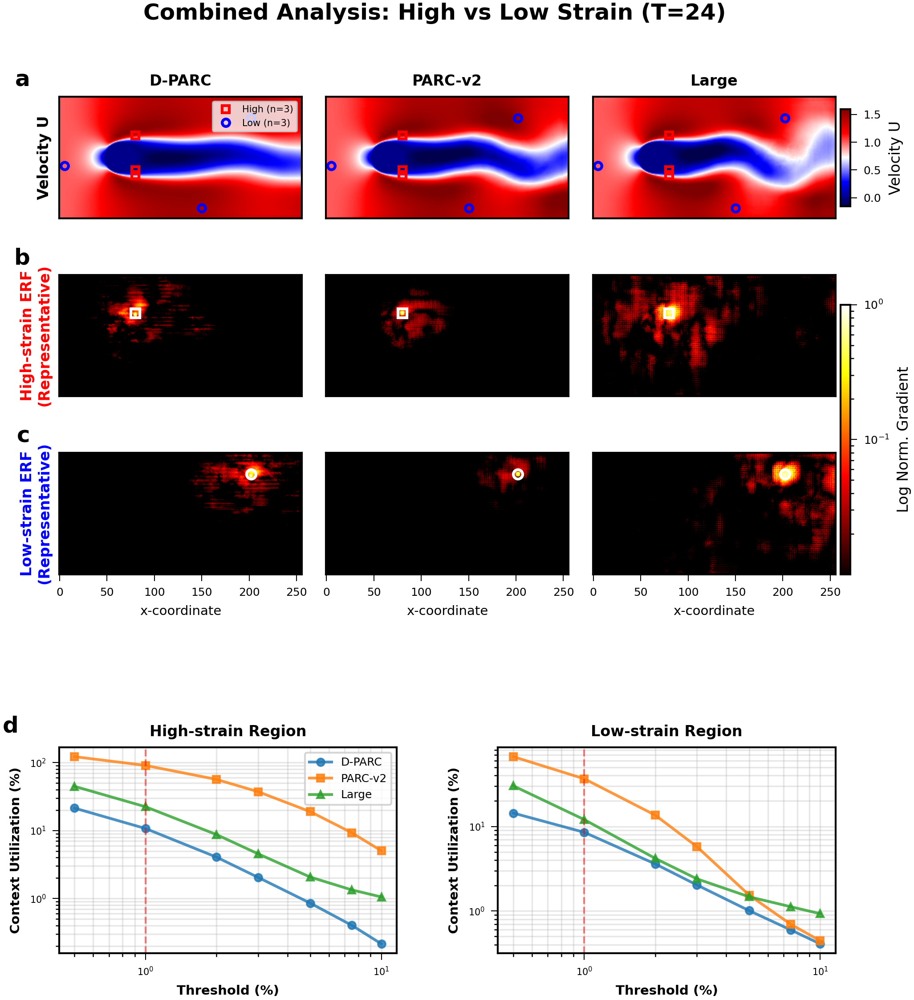

In [18]:
################################################################################
# CELL: Combined Publication Figure - High vs Low Strain (Navier-Stokes)
# UPDATED: Matches Relative Sparsity Logic (Context Utilization %)
################################################################################
"""
Generates a single, combined publication figure.
- Panel 'a': Velocity/Field visualization
- Panel 'b': High-strain ERF
- Panel 'c': Low-strain ERF
- Panel 'd': Context Utilization Log-Log Plots (Area / Denominator * 100)
"""

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D
import numpy as np
import gc
from pathlib import Path

print("\n" + "="*80)
print("GENERATING COMBINED FIGURE - CONTEXT UTILIZATION (LOG-LOG)")
print("="*80)

# =============================================================================
# Configuration
# =============================================================================

# Re-define TRF Area to ensure consistency with previous analysis
PARCV2_TRF_AREA = 6084 

# =============================================================================
# Sub-plotter: Panels (a, b, c) - Field + ERF Grids
# =============================================================================

def plot_panel_a_b_c_field_erf(
    fig, gs_panel,
    state_d_np, state_s_np, state_l_np,
    erf_high_d_masked, erf_high_s_masked, erf_high_l_masked, point_high,
    erf_low_d_masked, erf_low_s_masked, erf_low_l_masked, point_low,
    all_high_points, all_low_points,
    vmin, vmax, vmin_shared, field_label, cmap_field
):
    gs_sub = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=gs_panel,
                                              hspace=-0.32, wspace=0.1)

    high_marker_props = {'marker': 's', 'markersize': 4, 'markerfacecolor': 'none',
                         'markeredgecolor': 'red', 'markeredgewidth': 1.5, 'linestyle': 'none'}
    low_marker_props = {'marker': 'o', 'markersize': 4, 'markerfacecolor': 'none',
                        'markeredgecolor': 'blue', 'markeredgewidth': 1.5, 'linestyle': 'none'}

    field_axes = []
    erf_axes = []
    ax_a_ref, ax_b_ref, ax_c_ref = None, None, None

    # --- Row 0: Panel (a) - Field Input ---
    for col, (field_data, title) in enumerate([
        (state_d_np, 'D-PARC'),
        (state_s_np, 'PARC-v2'),
        (state_l_np, 'Large')
    ]):
        ax = fig.add_subplot(gs_sub[0, col])
        if col == 0: ax_a_ref = ax
        im = ax.imshow(field_data, cmap=cmap_field, origin='lower', vmin=vmin, vmax=vmax)
        field_axes.append(ax)

        for pt in all_high_points: ax.plot(pt[1], pt[0], **high_marker_props)
        for pt in all_low_points: ax.plot(pt[1], pt[0], **low_marker_props)

        ax.set_title(title, fontweight='bold', fontsize=8)
        if col == 0:
            ax.set_ylabel(f'{field_label}', fontweight='bold', fontsize=8)
            legend_elements = [
                Line2D([0], [0], **high_marker_props, label=f'High (n={len(all_high_points)})'),
                Line2D([0], [0], **low_marker_props, label=f'Low (n={len(all_low_points)})')
            ]
            ax.legend(handles=legend_elements, fontsize=5, loc='upper right')
        ax.set_xticks([]); ax.set_yticks([])

    # Colorbar Field
    pos_last = field_axes[-1].get_position()
    pos_first = field_axes[0].get_position()
    cbar_ax = fig.add_axes([pos_last.x1 + 0.005, pos_first.y0 + pos_first.height * 0.1, 0.01, pos_first.height * 0.8])
    fig.colorbar(im, cax=cbar_ax, label=field_label)
    cbar_ax.tick_params(labelsize=6)

    # --- Row 1: Panel (b) - High-strain ERF ---
    for col, (erf_data, title) in enumerate([
        (erf_high_d_masked, 'D-PARC'),
        (erf_high_s_masked, 'PARC-v2'),
        (erf_high_l_masked, 'Large')
    ]):
        ax = fig.add_subplot(gs_sub[1, col])
        if col == 0: ax_b_ref = ax
        ax.set_facecolor('black')
        im_erf = ax.imshow(erf_data, cmap='hot', origin='lower', norm=LogNorm(vmin=vmin_shared, vmax=1.0))
        erf_axes.append(ax)
        ax.plot(point_high[1], point_high[0], 's', markersize=5, mfc='none', mec='white', mew=1.5)
        if col == 0: ax.set_ylabel('High-strain ERF\n(Representative)', fontweight='bold', color='red', fontsize=8)
        ax.set_xticks([]); ax.set_yticks([])

    # --- Row 2: Panel (c) - Low-strain ERF ---
    for col, (erf_data, title) in enumerate([
        (erf_low_d_masked, 'D-PARC'),
        (erf_low_s_masked, 'PARC-v2'),
        (erf_low_l_masked, 'Large')
    ]):
        ax = fig.add_subplot(gs_sub[2, col])
        if col == 0: ax_c_ref = ax
        ax.set_facecolor('black')
        im_erf = ax.imshow(erf_data, cmap='hot', origin='lower', norm=LogNorm(vmin=vmin_shared, vmax=1.0))
        erf_axes.append(ax)
        ax.plot(point_low[1], point_low[0], 'o', markersize=5, mfc='none', mec='white', mew=1.5)
        ax.set_xlabel('x-coordinate', fontsize=7)
        if col == 0: ax.set_ylabel('Low-strain ERF\n(Representative)', fontweight='bold', color='blue', fontsize=8)
        ax.tick_params(axis='x', labelsize=6); ax.set_yticks([])

    # Colorbar ERF
    pos_last = erf_axes[-1].get_position()
    pos_first = erf_axes[0].get_position()
    cbar_ax = fig.add_axes([pos_last.x1 + 0.005, pos_last.y0, 0.01, (pos_first.y1 - pos_last.y0) * 0.9])
    fig.colorbar(im_erf, cax=cbar_ax, label='Log Norm. Gradient')
    cbar_ax.tick_params(labelsize=6)

    # Labels
    for ax, label in zip([ax_a_ref, ax_b_ref, ax_c_ref], ['a', 'b', 'c']):
        ax.text(-0.12, 1.05, label, transform=ax.transAxes, fontsize=12, fontweight='bold', va='bottom', ha='right')

# =============================================================================
# Sub-plotter: Panel (d) - Context Utilization (LOG-LOG)
# =============================================================================

def plot_panel_d_utilization(fig, gs_panel, high_areas, low_areas, thresholds, denoms):
    """
    Plots Context Utilization (%) = (Area / Denominator) * 100
    """
    gs_sub = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_panel, wspace=0.3)
    thresh_percent = np.array(thresholds) * 100
    line_props = {'linewidth': 1.5, 'markersize': 4, 'alpha': 0.8}
    
    # Helper to calculate utilization
    def get_util(model, area_list):
        return [(a / denoms[model]) * 100 for a in area_list]

    # --- High Strain ---
    ax = fig.add_subplot(gs_sub[0, 0])
    ax.text(-0.12, 1.05, 'd', transform=ax.transAxes, fontsize=12, fontweight='bold', va='bottom', ha='right')
    
    for model, marker in [('D-PARC', 'o-'), ('PARC-v2', 's-'), ('Large', '^-')]:
        y_vals = get_util(model, high_areas[model])
        ax.loglog(thresh_percent, y_vals, marker, label=model, **line_props)
        
    ax.axvline(1.0, color='red', ls='--', alpha=0.5, lw=1)
    ax.set_xlabel('Threshold (%)', fontweight='bold', fontsize=7)
    ax.set_ylabel('Context Utilization (%)', fontweight='bold', fontsize=7)
    ax.set_title('High-strain Region', fontweight='bold', fontsize=8)
    ax.legend(fontsize=6)
    ax.grid(True, alpha=0.3, which='both')
    
    # --- Low Strain ---
    ax = fig.add_subplot(gs_sub[0, 1])
    for model, marker in [('D-PARC', 'o-'), ('PARC-v2', 's-'), ('Large', '^-')]:
        y_vals = get_util(model, low_areas[model])
        ax.loglog(thresh_percent, y_vals, marker, label=model, **line_props)

    ax.axvline(1.0, color='red', ls='--', alpha=0.5, lw=1)
    ax.set_xlabel('Threshold (%)', fontweight='bold', fontsize=7)
    ax.set_ylabel('Context Utilization (%)', fontweight='bold', fontsize=7)
    ax.set_title('Low-strain Region', fontweight='bold', fontsize=8)
    ax.grid(True, alpha=0.3, which='both')

# =============================================================================
# Main Orchestrator
# =============================================================================

def plot_combined_figure(all_results, state_d, state_s, state_l, norm_params, 
                        all_high_points, all_low_points, thresholds, 
                        timestep, channel_idx, vmin, vmax, output_dir):
    
    print("\n[Info] Preparing combined figure data...")
    set_plot_style()

    # 1. Denominator Logic (Re-calculated for safety)
    H, W = state_d.shape[-2], state_d.shape[-1]
    global_area = H * W
    denoms = {
        'D-PARC': global_area,
        'Large': global_area,
        'PARC-v2': min(PARCV2_TRF_AREA, global_area)
    }
    print(f"[Info] Denominators: PARCv2={denoms['PARC-v2']}, Others={global_area}")

    # 2. Data Prep
    channel_names = ['Reynolds', 'Pressure', 'Velocity U', 'Velocity V']
    state_d_np = denormalize_channel(state_d[0, channel_idx].cpu().numpy(), channel_idx, norm_params)
    state_s_np = denormalize_channel(state_s[0, channel_idx].cpu().numpy(), channel_idx, norm_params)
    state_l_np = denormalize_channel(state_l[0, channel_idx].cpu().numpy(), channel_idx, norm_params)

    if vmin is None:
        all_vals = np.concatenate([state_d_np.flatten(), state_s_np.flatten(), state_l_np.flatten()])
        vmin, vmax = np.percentile(all_vals, 1), np.percentile(all_vals, 99)

    # Extract ERFs
    erf_high_d = all_results['D-PARC']['high_strain']['point_1']['erf_map']
    erf_high_s = all_results['PARC-v2']['high_strain']['point_1']['erf_map']
    erf_high_l = all_results['Large']['high_strain']['point_1']['erf_map']
    
    erf_low_d = all_results['D-PARC']['low_strain']['point_1']['erf_map']
    erf_low_s = all_results['PARC-v2']['low_strain']['point_1']['erf_map']
    erf_low_l = all_results['Large']['low_strain']['point_1']['erf_map']

    # Masking
    def process(erf):
        agg = erf.sum(0); norm = agg / (agg.max() + 1e-10)
        return np.where(norm > 0.01, norm, np.nan)
    
    masked_maps = [process(x) for x in [erf_high_d, erf_high_s, erf_high_l, erf_low_d, erf_low_s, erf_low_l]]
    vmin_shared = min([np.nanmin(x) for x in masked_maps if not np.all(np.isnan(x))])

    # Extract Areas for Panel D
    high_areas = {m: [all_results[m]['high_strain']['average'][t]['area_mean'] for t in thresholds] for m in denoms}
    low_areas = {m: [all_results[m]['low_strain']['average'][t]['area_mean'] for t in thresholds] for m in denoms}

    # 3. Plotting
    fig = plt.figure(figsize=(7.5, 9))
    main_gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1], hspace=0.25)

    plot_panel_a_b_c_field_erf(
        fig, main_gs[0],
        state_d_np, state_s_np, state_l_np,
        masked_maps[0], masked_maps[1], masked_maps[2], all_high_points[0],
        masked_maps[3], masked_maps[4], masked_maps[5], all_low_points[0],
        all_high_points, all_low_points,
        vmin, vmax, vmin_shared, channel_names[channel_idx], 'seismic'
    )

    plot_panel_d_utilization(
        fig, main_gs[1],
        high_areas, low_areas, thresholds, denoms
    )

    fig.suptitle(f'Combined Analysis: High vs Low Strain (T={timestep})', fontsize=12, fontweight='bold', y=0.9)
    plt.savefig(output_dir / f'COMBINED_ContextUtil_T{timestep}.png', dpi=300, bbox_inches='tight')
    plt.show()

# Run
try:
    plot_combined_figure(
        all_results,
        state_at_t_deform, state_at_t_standard, state_at_t_large,
        norm_params,
        HIGH_STRAIN_POINTS, LOW_STRAIN_POINTS, # Uses variables from previous cell
        TEST_THRESHOLDS,
        ANALYZE_TIMESTEP, CHANNEL_TO_VISUALIZE, VMIN_VIZ, VMAX_VIZ,
        OUTPUT_DIR
    )
except NameError:
    print("⚠️ Error: Run the Analysis Cell first to generate 'all_results' and 'HIGH_STRAIN_POINTS'.")

In [1]:
#rename


GENERATING COMBINED FIGURE - CONTEXT UTILIZATION (RENAMED)

[Info] Preparing combined figure data...
[Info] Denominators: PARCv2=6084, Others=32768
✓ Saved combined figure to: COMBINED_ContextUtil_T{timestep}.pdf


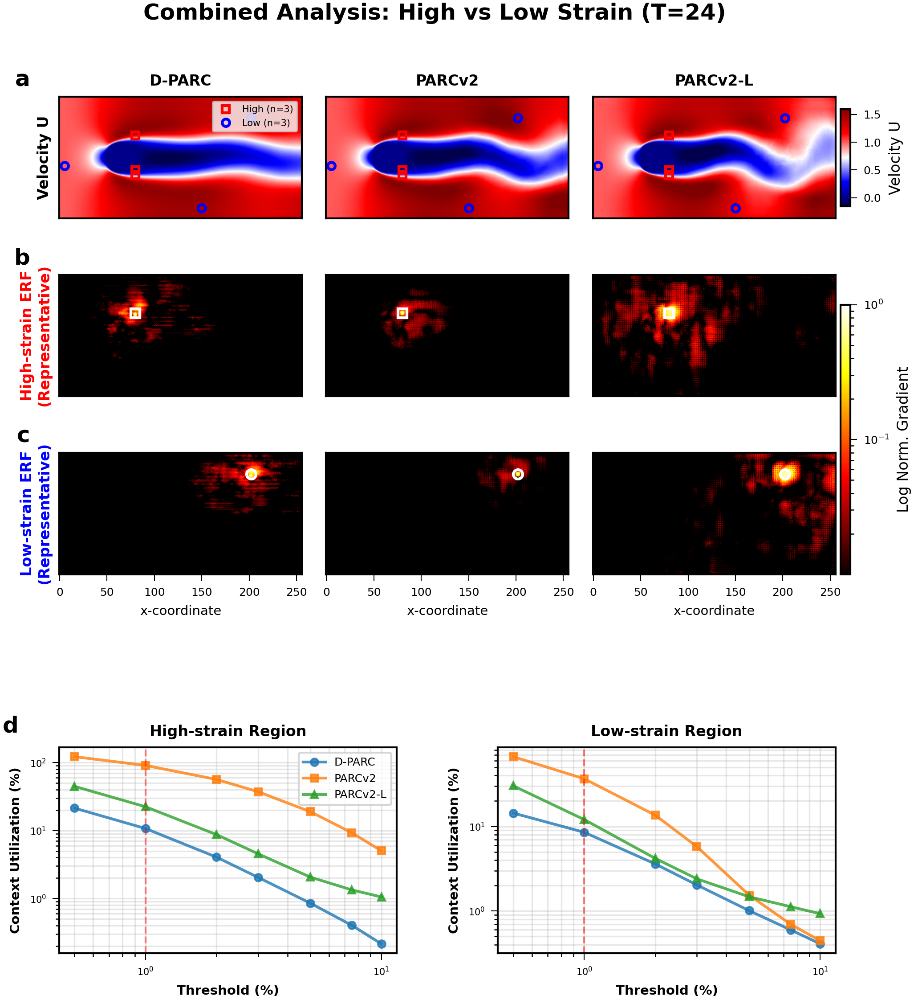

In [19]:
################################################################################
# CELL: Combined Publication Figure - High vs Low Strain (Navier-Stokes)
# UPDATED: Matches Relative Sparsity Logic (Context Utilization %)
# UPDATED: Renamed PARC-v2 -> PARCv2 and Large -> PARCv2-L
################################################################################
"""
Generates a single, combined publication figure.
- Panel 'a': Velocity/Field visualization
- Panel 'b': High-strain ERF
- Panel 'c': Low-strain ERF
- Panel 'd': Context Utilization Log-Log Plots (Area / Denominator * 100)
"""

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D
import numpy as np
import gc
from pathlib import Path

print("\n" + "="*80)
print("GENERATING COMBINED FIGURE - CONTEXT UTILIZATION (RENAMED)")
print("="*80)

# =============================================================================
# Configuration
# =============================================================================

# Re-define TRF Area to ensure consistency with previous analysis
PARCV2_TRF_AREA = 6084 

# =============================================================================
# Sub-plotter: Panels (a, b, c) - Field + ERF Grids
# =============================================================================

def plot_panel_a_b_c_field_erf(
    fig, gs_panel,
    state_d_np, state_s_np, state_l_np,
    erf_high_d_masked, erf_high_s_masked, erf_high_l_masked, point_high,
    erf_low_d_masked, erf_low_s_masked, erf_low_l_masked, point_low,
    all_high_points, all_low_points,
    vmin, vmax, vmin_shared, field_label, cmap_field
):
    gs_sub = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=gs_panel,
                                              hspace=-0.32, wspace=0.1)

    high_marker_props = {'marker': 's', 'markersize': 4, 'markerfacecolor': 'none',
                         'markeredgecolor': 'red', 'markeredgewidth': 1.5, 'linestyle': 'none'}
    low_marker_props = {'marker': 'o', 'markersize': 4, 'markerfacecolor': 'none',
                        'markeredgecolor': 'blue', 'markeredgewidth': 1.5, 'linestyle': 'none'}

    field_axes = []
    erf_axes = []
    ax_a_ref, ax_b_ref, ax_c_ref = None, None, None

    # --- Row 0: Panel (a) - Field Input ---
    # UPDATED LABELS
    for col, (field_data, title) in enumerate([
        (state_d_np, 'D-PARC'),
        (state_s_np, 'PARCv2'),     # Renamed
        (state_l_np, 'PARCv2-L')    # Renamed
    ]):
        ax = fig.add_subplot(gs_sub[0, col])
        if col == 0: ax_a_ref = ax
        im = ax.imshow(field_data, cmap=cmap_field, origin='lower', vmin=vmin, vmax=vmax)
        field_axes.append(ax)

        for pt in all_high_points: ax.plot(pt[1], pt[0], **high_marker_props)
        for pt in all_low_points: ax.plot(pt[1], pt[0], **low_marker_props)

        ax.set_title(title, fontweight='bold', fontsize=8)
        if col == 0:
            ax.set_ylabel(f'{field_label}', fontweight='bold', fontsize=8)
            legend_elements = [
                Line2D([0], [0], **high_marker_props, label=f'High (n={len(all_high_points)})'),
                Line2D([0], [0], **low_marker_props, label=f'Low (n={len(all_low_points)})')
            ]
            ax.legend(handles=legend_elements, fontsize=5, loc='upper right')
        ax.set_xticks([]); ax.set_yticks([])

    # Colorbar Field
    pos_last = field_axes[-1].get_position()
    pos_first = field_axes[0].get_position()
    cbar_ax = fig.add_axes([pos_last.x1 + 0.005, pos_first.y0 + pos_first.height * 0.1, 0.01, pos_first.height * 0.8])
    fig.colorbar(im, cax=cbar_ax, label=field_label)
    cbar_ax.tick_params(labelsize=6)

    # --- Row 1: Panel (b) - High-strain ERF ---
    # UPDATED LABELS
    for col, (erf_data, title) in enumerate([
        (erf_high_d_masked, 'D-PARC'),
        (erf_high_s_masked, 'PARCv2'),    # Renamed
        (erf_high_l_masked, 'PARCv2-L')   # Renamed
    ]):
        ax = fig.add_subplot(gs_sub[1, col])
        if col == 0: ax_b_ref = ax
        ax.set_facecolor('black')
        im_erf = ax.imshow(erf_data, cmap='hot', origin='lower', norm=LogNorm(vmin=vmin_shared, vmax=1.0))
        erf_axes.append(ax)
        ax.plot(point_high[1], point_high[0], 's', markersize=5, mfc='none', mec='white', mew=1.5)
        if col == 0: ax.set_ylabel('High-strain ERF\n(Representative)', fontweight='bold', color='red', fontsize=8)
        ax.set_xticks([]); ax.set_yticks([])

    # --- Row 2: Panel (c) - Low-strain ERF ---
    # UPDATED LABELS
    for col, (erf_data, title) in enumerate([
        (erf_low_d_masked, 'D-PARC'),
        (erf_low_s_masked, 'PARCv2'),     # Renamed
        (erf_low_l_masked, 'PARCv2-L')    # Renamed
    ]):
        ax = fig.add_subplot(gs_sub[2, col])
        if col == 0: ax_c_ref = ax
        ax.set_facecolor('black')
        im_erf = ax.imshow(erf_data, cmap='hot', origin='lower', norm=LogNorm(vmin=vmin_shared, vmax=1.0))
        erf_axes.append(ax)
        ax.plot(point_low[1], point_low[0], 'o', markersize=5, mfc='none', mec='white', mew=1.5)
        ax.set_xlabel('x-coordinate', fontsize=7)
        if col == 0: ax.set_ylabel('Low-strain ERF\n(Representative)', fontweight='bold', color='blue', fontsize=8)
        ax.tick_params(axis='x', labelsize=6); ax.set_yticks([])

    # Colorbar ERF
    pos_last = erf_axes[-1].get_position()
    pos_first = erf_axes[0].get_position()
    cbar_ax = fig.add_axes([pos_last.x1 + 0.005, pos_last.y0, 0.01, (pos_first.y1 - pos_last.y0) * 0.9])
    fig.colorbar(im_erf, cax=cbar_ax, label='Log Norm. Gradient')
    cbar_ax.tick_params(labelsize=6)

    # Labels
    for ax, label in zip([ax_a_ref, ax_b_ref, ax_c_ref], ['a', 'b', 'c']):
        ax.text(-0.12, 1.05, label, transform=ax.transAxes, fontsize=12, fontweight='bold', va='bottom', ha='right')

# =============================================================================
# Sub-plotter: Panel (d) - Context Utilization (LOG-LOG)
# =============================================================================

def plot_panel_d_utilization(fig, gs_panel, high_areas, low_areas, thresholds, denoms):
    """
    Plots Context Utilization (%) = (Area / Denominator) * 100
    """
    gs_sub = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_panel, wspace=0.3)
    thresh_percent = np.array(thresholds) * 100
    line_props = {'linewidth': 1.5, 'markersize': 4, 'alpha': 0.8}
    
    # Helper to calculate utilization
    def get_util(model, area_list):
        return [(a / denoms[model]) * 100 for a in area_list]

    # --- High Strain ---
    ax = fig.add_subplot(gs_sub[0, 0])
    ax.text(-0.12, 1.05, 'd', transform=ax.transAxes, fontsize=12, fontweight='bold', va='bottom', ha='right')
    
    # UPDATED LABELS
    for model, marker in [('D-PARC', 'o-'), ('PARCv2', 's-'), ('PARCv2-L', '^-')]:
        y_vals = get_util(model, high_areas[model])
        ax.loglog(thresh_percent, y_vals, marker, label=model, **line_props)
        
    ax.axvline(1.0, color='red', ls='--', alpha=0.5, lw=1)
    ax.set_xlabel('Threshold (%)', fontweight='bold', fontsize=7)
    ax.set_ylabel('Context Utilization (%)', fontweight='bold', fontsize=7)
    ax.set_title('High-strain Region', fontweight='bold', fontsize=8)
    ax.legend(fontsize=6)
    ax.grid(True, alpha=0.3, which='both')
    
    # --- Low Strain ---
    ax = fig.add_subplot(gs_sub[0, 1])
    # UPDATED LABELS
    for model, marker in [('D-PARC', 'o-'), ('PARCv2', 's-'), ('PARCv2-L', '^-')]:
        y_vals = get_util(model, low_areas[model])
        ax.loglog(thresh_percent, y_vals, marker, label=model, **line_props)

    ax.axvline(1.0, color='red', ls='--', alpha=0.5, lw=1)
    ax.set_xlabel('Threshold (%)', fontweight='bold', fontsize=7)
    ax.set_ylabel('Context Utilization (%)', fontweight='bold', fontsize=7)
    ax.set_title('Low-strain Region', fontweight='bold', fontsize=8)
    ax.grid(True, alpha=0.3, which='both')

# =============================================================================
# Main Orchestrator
# =============================================================================

def plot_combined_figure(all_results, state_d, state_s, state_l, norm_params, 
                         all_high_points, all_low_points, thresholds, 
                         timestep, channel_idx, vmin, vmax, output_dir):
    
    print("\n[Info] Preparing combined figure data...")
    set_plot_style()

    # 1. Denominator Logic (Re-calculated for safety)
    H, W = state_d.shape[-2], state_d.shape[-1]
    global_area = H * W
    
    # UPDATED KEYS
    denoms = {
        'D-PARC': global_area,
        'PARCv2-L': global_area,
        'PARCv2': min(PARCV2_TRF_AREA, global_area)
    }
    print(f"[Info] Denominators: PARCv2={denoms['PARCv2']}, Others={global_area}")

    # 2. Data Prep
    channel_names = ['Reynolds', 'Pressure', 'Velocity U', 'Velocity V']
    state_d_np = denormalize_channel(state_d[0, channel_idx].cpu().numpy(), channel_idx, norm_params)
    state_s_np = denormalize_channel(state_s[0, channel_idx].cpu().numpy(), channel_idx, norm_params)
    state_l_np = denormalize_channel(state_l[0, channel_idx].cpu().numpy(), channel_idx, norm_params)

    if vmin is None:
        all_vals = np.concatenate([state_d_np.flatten(), state_s_np.flatten(), state_l_np.flatten()])
        vmin, vmax = np.percentile(all_vals, 1), np.percentile(all_vals, 99)

    # Extract ERFs - NOTE: Using OLD KEYS to fetch
    erf_high_d = all_results['D-PARC']['high_strain']['point_1']['erf_map']
    erf_high_s = all_results['PARC-v2']['high_strain']['point_1']['erf_map']
    erf_high_l = all_results['Large']['high_strain']['point_1']['erf_map']
    
    erf_low_d = all_results['D-PARC']['low_strain']['point_1']['erf_map']
    erf_low_s = all_results['PARC-v2']['low_strain']['point_1']['erf_map']
    erf_low_l = all_results['Large']['low_strain']['point_1']['erf_map']

    # Masking
    def process(erf):
        agg = erf.sum(0); norm = agg / (agg.max() + 1e-10)
        return np.where(norm > 0.01, norm, np.nan)
    
    masked_maps = [process(x) for x in [erf_high_d, erf_high_s, erf_high_l, erf_low_d, erf_low_s, erf_low_l]]
    vmin_shared = min([np.nanmin(x) for x in masked_maps if not np.all(np.isnan(x))])

    # Extract Areas for Panel D
    # FETCH OLD KEYS -> STORE NEW KEYS
    high_areas = {
        'D-PARC': [all_results['D-PARC']['high_strain']['average'][t]['area_mean'] for t in thresholds],
        'PARCv2': [all_results['PARC-v2']['high_strain']['average'][t]['area_mean'] for t in thresholds],
        'PARCv2-L': [all_results['Large']['high_strain']['average'][t]['area_mean'] for t in thresholds]
    }
    low_areas = {
        'D-PARC': [all_results['D-PARC']['low_strain']['average'][t]['area_mean'] for t in thresholds],
        'PARCv2': [all_results['PARC-v2']['low_strain']['average'][t]['area_mean'] for t in thresholds],
        'PARCv2-L': [all_results['Large']['low_strain']['average'][t]['area_mean'] for t in thresholds]
    }

    # 3. Plotting
    fig = plt.figure(figsize=(7.5, 9))
    main_gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1], hspace=0.25)

    plot_panel_a_b_c_field_erf(
        fig, main_gs[0],
        state_d_np, state_s_np, state_l_np,
        masked_maps[0], masked_maps[1], masked_maps[2], all_high_points[0],
        masked_maps[3], masked_maps[4], masked_maps[5], all_low_points[0],
        all_high_points, all_low_points,
        vmin, vmax, vmin_shared, channel_names[channel_idx], 'seismic'
    )

    plot_panel_d_utilization(
        fig, main_gs[1],
        high_areas, low_areas, thresholds, denoms
    )

    fig.suptitle(f'Combined Analysis: High vs Low Strain (T={timestep})', fontsize=12, fontweight='bold', y=0.9)
    #plt.savefig(output_dir / f'COMBINED_ContextUtil_T{timestep}.png', dpi=300, bbox_inches='tight')
    output_path_pdf = 'COMBINED_ContextUtil_T{timestep}.pdf'
    plt.savefig(output_path_pdf, bbox_inches='tight')
    print(f"✓ Saved combined figure to: {output_path_pdf}")
    plt.show()

# Run
try:
    plot_combined_figure(
        all_results,
        state_at_t_deform, state_at_t_standard, state_at_t_large,
        norm_params,
        HIGH_STRAIN_POINTS, LOW_STRAIN_POINTS, # Uses variables from previous cell
        TEST_THRESHOLDS,
        ANALYZE_TIMESTEP, CHANNEL_TO_VISUALIZE, VMIN_VIZ, VMAX_VIZ,
        OUTPUT_DIR
    )
except NameError:
    print("⚠️ Error: Run the Analysis Cell first to generate 'all_results' and 'HIGH_STRAIN_POINTS'.")

In [14]:
def calculate_corrected_theoretical_rf(num_down_stages, has_deform_conv=False):
    """
    Calculate theoretical RF based on actual architecture.
    
    Architecture per stage:
    - Initial: 3×3 conv (+ 1×1 conv, doesn't add RF)
    - Down stages: 3×3 conv, 1×1 conv, 2×2 maxpool (stride 2)
    - Up stages: Upsample, 3×3 conv, 1×1 conv
    - Final: Two 1×1 convs (don't add RF)
    
    For deformable conv: offset_conv guides sampling but doesn't contribute to RF.
    Only the DeformConv2d (3×3) itself counts, same as standard Conv2d (3×3).
    """
    rf = 1
    stride = 1
    
    print(f"\n{'Stage':<35} {'Operation':<25} {'Kernel':<10} {'Stride':<10} {'RF':<10} {'Cum. Stride':<15}")
    print("-" * 110)
    
    # Initial doubleConv
    # Only count the main 3×3 conv (DeformConv2d or Conv2d)
    rf = rf + (3 - 1) * stride
    conv_type = "DeformConv2d 3×3" if has_deform_conv else "Conv2d 3×3"
    print(f"{'Initial doubleConv':<35} {conv_type:<25} {3:<10} {1:<10} {rf:<10} {stride:<15}")
    
    # Downsampling stages
    for stage in range(num_down_stages):
        stage_num = stage + 1
        
        # Only count the main 3×3 conv (DeformConv2d or Conv2d)
        rf = rf + (3 - 1) * stride
        conv_type = "DeformConv2d 3×3" if has_deform_conv else "Conv2d 3×3"
        print(f"{f'Down Stage {stage_num}':<35} {conv_type:<25} {3:<10} {1:<10} {rf:<10} {stride:<15}")
        
        # MaxPool: 2×2, stride 2
        rf = rf + (2 - 1) * stride
        stride = stride * 2
        print(f"{f'Down Stage {stage_num}':<35} {'MaxPool2d 2×2':<25} {2:<10} {2:<10} {rf:<10} {stride:<15}")
    
    # Upsampling stages (decoder)
    for stage in range(num_down_stages):
        stage_num = stage + 1
        
        # Upsample (doesn't change RF in input space, reduces stride)
        stride = stride // 2
        print(f"{f'Up Stage {stage_num}':<35} {'Upsample 2×':<25} {'-':<10} {'0.5':<10} {rf:<10} {stride:<15}")
        
        # Only count the main 3×3 conv (DeformConv2d or Conv2d)
        rf = rf + (3 - 1) * stride
        conv_type = "DeformConv2d 3×3" if has_deform_conv else "Conv2d 3×3"
        print(f"{f'Up Stage {stage_num}':<35} {conv_type:<25} {3:<10} {1:<10} {rf:<10} {stride:<15}")
    
    return rf


print("\n" + "="*80)
print("CORRECTED THEORETICAL RECEPTIVE FIELD CALCULATIONS")
print("="*80)
print("\n📌 NOTE: Deformable convolutions have the SAME theoretical RF as standard")
print("   convolutions. The offset_conv predicts WHERE to sample (routing), but")
print("   doesn't contribute to RF. Only the DeformConv2d kernel (3×3) counts.")
print("="*80)

print("\n" + "="*80)
print("D-PARC (4 downsampling stages, with deformable convolutions)")
print("="*80)
rf_dparc = calculate_corrected_theoretical_rf(num_down_stages=4, has_deform_conv=True)
print(f"\n{'='*80}")
print(f"FINAL THEORETICAL RF (D-PARC): {rf_dparc} pixels")
print(f"{'='*80}")

print("\n" + "="*80)
print("PARC-v2 (4 downsampling stages, standard convolutions)")
print("="*80)
rf_parc = calculate_corrected_theoretical_rf(num_down_stages=4, has_deform_conv=False)
print(f"\n{'='*80}")
print(f"FINAL THEORETICAL RF (PARC-v2): {rf_parc} pixels")
print(f"{'='*80}")

print("\n" + "="*80)
print("Large PARC-v2 (6 downsampling stages, standard convolutions)")
print("="*80)
rf_large = calculate_corrected_theoretical_rf(num_down_stages=6, has_deform_conv=False)
print(f"\n{'='*80}")
print(f"FINAL THEORETICAL RF (Large): {rf_large} pixels")
print(f"{'='*80}")

# Updated comparison with your UNet-Only ERF metrics from the Navier-Stokes output
print("\n" + "="*80)
print("THEORETICAL vs EMPIRICAL COMPARISON")
print("="*80)
print(f"\n{'Model':<15} {'Stages':<10} {'Theoretical RF':<18} {'r50':<10} {'r90':<10} {'r50/Theo':<12} {'r90/Theo':<12}")
print("-" * 95)

# D-PARC (from your Navier-Stokes output)
r50_d = 23.3
r90_d = 67.4
print(f"{'D-PARC':<15} {4:<10} {rf_dparc:<18} {r50_d:<10.1f} {r90_d:<10.1f} {r50_d/rf_dparc:<12.2%} {r90_d/rf_dparc:<12.2%}")

# PARC-v2 (from your Navier-Stokes output)
r50_s = 24.6
r90_s = 42.8
print(f"{'PARC-v2':<15} {4:<10} {rf_parc:<18} {r50_s:<10.1f} {r90_s:<10.1f} {r50_s/rf_parc:<12.2%} {r90_s/rf_parc:<12.2%}")

# Large (from your Navier-Stokes output)
r50_l = 21.2
r90_l = 115.7
print(f"{'Large':<15} {6:<10} {rf_large:<18} {r50_l:<10.1f} {r90_l:<10.1f} {r50_l/rf_large:<12.2%} {r90_l/rf_large:<12.2%}")

print("\n" + "="*80)
print("KEY INSIGHTS FOR NAVIER-STOKES DATASET")
print("="*80)

print("\n" + "="*80)
print("SUMMARY TABLE FOR PAPER")
print("="*80)
print(f"\n{'Model':<12} {'Stages':<8} {'Deform':<8} {'Theo RF':<10} {'r50':<8} {'r90':<8} {'Efficiency':<12}")
print("-" * 75)
print(f"{'D-PARC':<12} {4:<8} {'Yes':<8} {rf_dparc:<10} {r50_d:<8.1f} {r90_d:<8.1f} {r50_d/rf_dparc:<12.1%}")
print(f"{'PARC-v2':<12} {4:<8} {'No':<8} {rf_parc:<10} {r50_s:<8.1f} {r90_s:<8.1f} {r50_s/rf_parc:<12.1%}")
print(f"{'Large':<12} {6:<8} {'No':<8} {rf_large:<10} {r50_l:<8.1f} {r90_l:<8.1f} {r50_l/rf_large:<12.1%}")

print("\n💡 Key Takeaway: D-PARC achieves the best balance of theoretical RF")
print("   and empirical efficiency through adaptive deformable sampling!")


CORRECTED THEORETICAL RECEPTIVE FIELD CALCULATIONS

📌 NOTE: Deformable convolutions have the SAME theoretical RF as standard
   convolutions. The offset_conv predicts WHERE to sample (routing), but
   doesn't contribute to RF. Only the DeformConv2d kernel (3×3) counts.

D-PARC (4 downsampling stages, with deformable convolutions)

Stage                               Operation                 Kernel     Stride     RF         Cum. Stride    
--------------------------------------------------------------------------------------------------------------
Initial doubleConv                  DeformConv2d 3×3          3          1          3          1              
Down Stage 1                        DeformConv2d 3×3          3          1          5          1              
Down Stage 1                        MaxPool2d 2×2             2          2          6          2              
Down Stage 2                        DeformConv2d 3×3          3          1          10         2              
